# 3D Scanner

**This code was written by Gautam Banuru under supervision of Charles Folkes. I, under no circumstances, permit any form of Academic Dishonesty at any level of education, including but not limited to cheating on graded materials.**

**DO NOT use this code for an assignment in any way, shape, or form. It is Academic Dishonesty. You have been thoroughly warned.**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from camutils import Camera,triangulate
import pickle
import visutils
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
import cv2
import glob
import scipy.optimize
from scipy.spatial import Delaunay
from meshutils import writeply

%matplotlib notebook

In [2]:
def makerotation(rx,ry,rz):
    """
    Generate a rotation matrix    

    Parameters
    ----------
    rx,ry,rz : floats
        Amount to rotate around x, y and z axes in degrees

    Returns
    -------
    R : 2D numpy.array (dtype=float)
        Rotation matrix of shape (3,3)
    """
    #x-rotation matrix
    Rx = np.array([[1,          0,           0], 
                   [0, np.cos(np.radians(rx)), -np.sin(np.radians(rx))],
                   [0, np.sin(np.radians(rx)),  np.cos(np.radians(rx))]])

    #y-rotation matrix
    Ry = np.array([[np.cos(np.radians(ry)) , 0, np.sin(np.radians(ry))],
                   [0          , 1,          0],
                   [-np.sin(np.radians(ry)), 0, np.cos(np.radians(ry))]])

    #z-rotatiom matrix
    Rz = np.array([[np.cos(np.radians(rz)), -np.sin(np.radians(rz)), 0],
                   [np.sin(np.radians(rz)),  np.cos(np.radians(rz)), 0], 
                   [0         ,           0, 1]])
    
    
    #compute rotation on x, y, z axis
    Rxyz = Rx @ Ry @ Rz
  
    return Rxyz

In [3]:
class Camera:
    """
    A simple data structure describing camera parameters 
    
    The parameters describing the camera
    cam.f : float   --- camera focal length (in units of pixels)
    cam.c : 2x1 vector  --- offset of principle point
    cam.R : 3x3 matrix --- camera rotation
    cam.t : 3x1 vector --- camera translation 
    """
    
    def __init__(self,f,c,R,t):
        self.f = f
        self.c = c
        self.R = R
        self.t = t

    def __str__(self):
        return f'Camera : \n f={self.f} \n c={self.c.T} \n R={self.R} \n t = {self.t.T}'
    
    def project(self,pts3):
        """
        Project the given 3D points in world coordinates into the specified camera    

        Parameters
        ----------
        pts3 : 2D numpy.array (dtype=float)
            Coordinates of N points stored in a array of shape (3,N)

        Returns
        -------
        pts2 : 2D numpy.array (dtype=float)
            Image coordinates of N points stored in an array of shape (2,N)

        """
        
        # get point location relative to camera
        pcam = self.R.transpose() @ (pts3 - self.t)
        
        # project
        p = self.f * (pcam / pcam[2:])
        
        # offset principal point
        pts2 = p[0:2,:] + self.c
        
        return pts2

    def update_extrinsics(self,params):
        """
        Given a vector of extrinsic parameters, update the camera
        to use the provided parameters.
  
        Parameters
        ----------
        params : 1D numpy.array (dtype=float)
            Camera parameters we are optimizing over stored in a vector
            params[0:2] are the rotation angles, params[2:5] are the translation

        """ 
        
        #update cam rotation and translation
        self.R = makerotation(params[0], params[1], params[2])
        self.t = np.array([params[3], params[4], params[5]]).reshape(3,1)

In [4]:
def residuals(pts3,pts2,cam,params):
    """
    Compute the difference between the projection of 3D points by the camera
    with the given parameters and the observed 2D locations

    Parameters
    ----------
    pts3 : 2D numpy.array (dtype=float)
        Coordinates of N points stored in a array of shape (3,N)

    pts2 : 2D numpy.array (dtype=float)
        Coordinates of N points stored in a array of shape (2,N)

    params : 1D numpy.array (dtype=float)
        Camera parameters we are optimizing stored in a vector of shape (6)

    Returns
    -------
    residual : 1D numpy.array (dtype=float)
        Vector of residual 2D projection errors of size 2*N
        
    """
    
    #update cam with params
    cam.update_extrinsics(params)
    
    #compute difference between projections in 1D array
    newpts2 = cam.project(pts3).reshape(-1)
    pts2 = pts2.reshape(-1)
    
    return pts2 - newpts2

In [5]:
def calibratePose(pts3,pts2,cam,params_init):
    """
    Calibrate the provided camera by updating R,t so that pts3 projects
    as close as possible to pts2

    Parameters
    ----------
    pts3 : 2D numpy.array (dtype=float)
        Coordinates of N points stored in a array of shape (3,N)

    pts2 : 2D numpy.array (dtype=float)
        Coordinates of N points stored in a array of shape (2,N)

    cam : Camera
        Initial estimate of camera
        
    params_init : 1D numpy.array (dtype=float)
        Initial estimate of camera extrinsic parameters ()
        params[0:2] are the rotation angles, params[2:5] are the translation

    Returns
    -------
    cam : Camera
        Refined estimate of camera with updated R,t parameters
        
    """
    
    #create residual function for scipy.optimize.leastsq
    func_residual = lambda t : residuals(pts3,pts2,cam,t)
    optimum_param,_ = scipy.optimize.leastsq(func_residual, params_init)
    
    #update cam
    cam.update_extrinsics(optimum_param)
    
    return cam

In [6]:
def triangulate(pts2L,camL,pts2R,camR):
    """
    Triangulate the set of points seen at location pts2L / pts2R in the
    corresponding pair of cameras. Return the 3D coordinates relative
    to the global coordinate system


    Parameters
    ----------
    pts2L : 2D numpy.array (dtype=float)
        Coordinates of N points stored in a array of shape (2,N) seen from camL camera

    pts2R : 2D numpy.array (dtype=float)
        Coordinates of N points stored in a array of shape (2,N) seen from camR camera

    camL : Camera
        The first "left" camera view

    camR : Camera
        The second "right" camera view

    Returns
    -------
    pts3 : 2D numpy.array (dtype=float)
        (3,N) array containing 3D coordinates of the points in global coordinates

    """

    #
    # Your code goes here.  I recommend adding assert statements to check the
    # sizes of the inputs and outputs to make sure they are correct 
    pts3 = np.array([[],[],[]])
    
    #step 1: get t of camera L relative to camera R
    t = (camR.t - camL.t)
    
    for xL, yL, xR, yR in zip(pts2L[0], pts2L[1], pts2R[0], pts2R[1]):
  
        #step 2: get qL and qR (3x1)
        qL = np.array([[(xL - np.squeeze(camL.c[0]))/camL.f],\
                       [(yL - np.squeeze(camL.c[1]))/camL.f],\
                       [                  1                ]])
    
        qR = np.array([[(xR - np.squeeze(camR.c[0]))/camR.f],\
                       [(yR - np.squeeze(camR.c[1]))/camR.f],\
                       [                 1               ]])
    
        #step 3: find zL and zR using least linear squares of A (3x2) and t (3x1)
        A = np.column_stack(((camL.R @ qL),(-camR.R @ qR)))
    
        zLR = np.linalg.lstsq(A, t, rcond = None)[0]
    
        zL = np.squeeze(zLR[0])
        zR = np.squeeze(zLR[1])
        
        #step 4: find PL and PR (3x1) relative to camL and camR, 
        #        then covert to world coords PW (3x1)
        PL = (zL) * qL 
        PR = (zR) * qR 
    
        PWL = (camL.R @ PL) + camL.t  
        PWR = (camR.R @ PR) + camR.t
    
        PW = (PWL + PWR) * .5
        
        #step 5: insert PW to pts3 (3xN)
        pts3 = np.column_stack((pts3, PW))
    
    #step 6: do above for each point

    return pts3

In [7]:
# %load calibrate.py
#
# To run:
#
# Install opencv modules in Anaconda environment:
#
#   conda install opencv
#   pip install --upgrade pip
#   pip install opencv-contrib-python
#
# Run calibrate.py from the commandline:
#
#   python calibrate.py

# file names, modify as necessary
calibimgfiles = '/Users/gbanuru/Documents/UCI Class Folders/Spring19/CS 117/Project/calib_jpg_u/*.jpg'
resultfile = 'calibration.pickle'

# checkerboard coordinates in 3D
objp = np.zeros((6*8,3), np.float32)
objp[:,:2] = 2.8*np.mgrid[0:8, 0:6].T.reshape(-1,2)

# arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob(calibimgfiles)

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img_size = (img.shape[1], img.shape[0])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (8,6), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Display image with the corners overlayed
        cv2.drawChessboardCorners(img, (8,6), corners, ret)
        cv2.imshow('img', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

# now perform the calibration
ret, K, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

print("Estimated camera intrinsic parameter matrix K")
print(K)
print("Estimated radial distortion coefficients")
print(dist)

print("Individual intrinsic parameters")
print("fx = ",K[0][0])
print("fy = ",K[1][1])
print("cx = ",K[0][2])
print("cy = ",K[1][2])

# save the results out to a file for later use
calib = {}
calib["fx"] = K[0][0]
calib["fy"] = K[1][1]
calib["cx"] = K[0][2]
calib["cy"] = K[1][2]
calib["dist"] = dist
fid = open(resultfile, "wb" ) 
pickle.dump(calib,fid)
fid.close()

#
# optionally go through and remove radial distortion from a set of images
#
#images = glob.glob(calibimgfiles)
#for idx, fname in enumerate(images):
#    img = cv2.imread(fname)
#    img_size = (img.shape[1], img.shape[0])
#
#    dst = cv2.undistort(img, K, dist, None, K)
#    udfname = fname+'undistort.jpg'
#    cv2.imwrite(udfname,dst)
#

Estimated camera intrinsic parameter matrix K
[[1.40530791e+03 0.00000000e+00 9.62167368e+02]
 [0.00000000e+00 1.40389402e+03 5.90915957e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Estimated radial distortion coefficients
[[-5.23053890e-03  8.05964694e-02  2.01737040e-05 -3.90735933e-03
  -1.08096617e-01]]
Individual intrinsic parameters
fx =  1405.3079107641308
fy =  1403.8940216156002
cx =  962.1673684721327
cy =  590.9159567824664


Camera L Extrinsic Parameters:
Camera : 
 f=1404.6009661898656 
 c=[[962.16736847 590.91595678]] 
 R=[[ 0.03843674  0.98947412  0.13951197]
 [ 0.97735771 -0.00815435 -0.21143654]
 [-0.20807335  0.14448003 -0.96738359]] 
 t = [[ 6.86588621 19.52346895 47.34419201]]

Camera R Extrinsic Parameters:
Camera : 
 f=1404.6009661898656 
 c=[[962.16736847 590.91595678]] 
 R=[[-0.00259871  0.99096865  0.13406857]
 [ 0.99277875 -0.0135225   0.11919516]
 [ 0.11993161  0.13341018 -0.98377748]] 
 t = [[ 7.50010535  7.20926512 47.76495331]]

Camera L Reprojected Points:


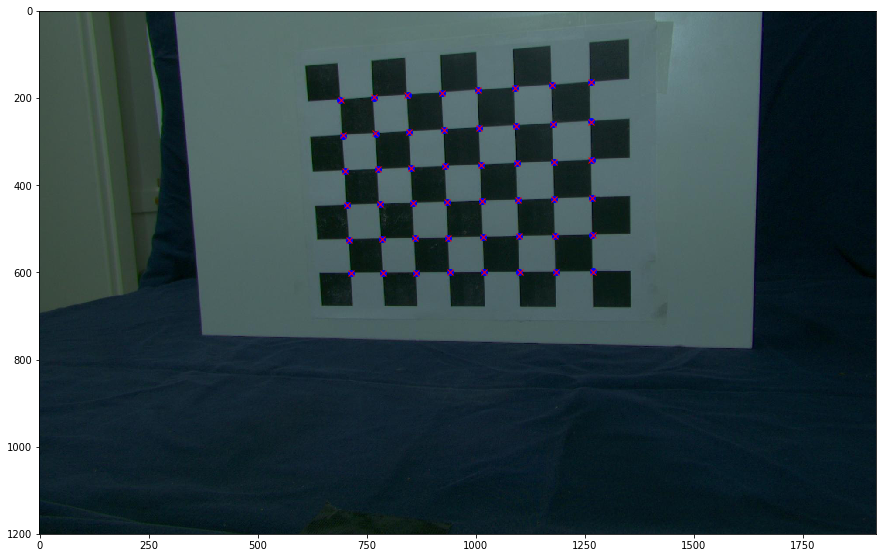

Camera R Reprojected Points:


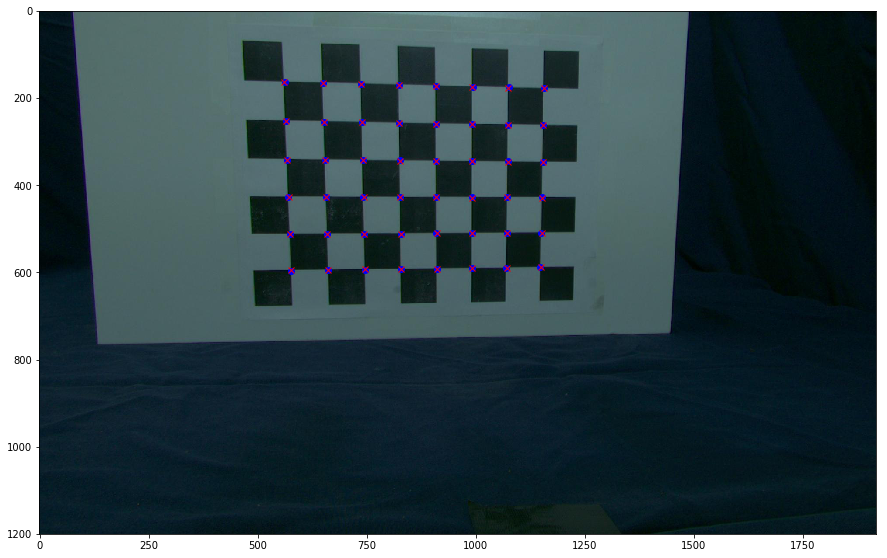

In [8]:
import cv2

# load in the intrinsic camera parameters from 'calibration.pickle'

# done above 

# create Camera objects representing the left and right cameras
# use the known intrinsic parameters you loaded in.
avg_focal = (calib["fx"] + calib["fy"]) / 2
c_arr = np.array([[calib["cx"], calib["cy"]]]).reshape(2,1)

camL = Camera(f=avg_focal, c=c_arr, t=np.array([[0,0,0]]).T, R=makerotation(0,0,0))
camR = Camera(f=avg_focal, c=c_arr, t=np.array([[0,0,0]]).T, R=makerotation(0,0,0))

# load in the left and right images and find the coordinates of
# the chessboard corners using OpenCV
imgL = plt.imread('calib_jpg_u/frame_C0_01.jpg')
ret, cornersL = cv2.findChessboardCorners(imgL, (8,6), None)
pts2L = cornersL.squeeze().T

imgR = plt.imread('calib_jpg_u/frame_C1_01.jpg')
ret, cornersR = cv2.findChessboardCorners(imgR, (8,6), None)
pts2R = cornersR.squeeze().T

# generate the known 3D point coordinates of points on the checkerboard in cm
pts3 = np.zeros((3,6*8))
yy,xx = np.meshgrid(np.arange(8),np.arange(6))
pts3[0,:] = 2.8*xx.reshape(1,-1)
pts3[1,:] = 2.8*yy.reshape(1,-1)


# Now use your calibratePose function to get the extrinsic parameters
# for the two images. You may need to experiment with the initialization
# in order to get a good result

camL = calibratePose(pts3, pts2L, camL, np.array([0,0,0,0,0, -2]))
camR = calibratePose(pts3, pts2R, camR, np.array([0,0,0,0,0, -2]))

print("Camera L Extrinsic Parameters:\n{}\n".format(camL))
print("Camera R Extrinsic Parameters:\n{}\n".format(camR))

# As a final test, triangulate the corners of the checkerboard to get back there 3D locations

pts3r = triangulate(pts2L, camL, pts2R, camR)

# Display the reprojected points overlayed on the images to make 
# sure they line up
plt.rcParams['figure.figsize']=[15,15]
print("Camera L Reprojected Points:")
pts2Lp = camL.project(pts3)
plt.imshow(imgL)
plt.plot(pts2Lp[0,:],pts2Lp[1,:],'bo')
plt.plot(pts2L[0,:],pts2L[1,:],'rx')
plt.show()

print("Camera R Reprojected Points:")
pts2Rp = camR.project(pts3)
plt.imshow(imgR)
plt.plot(pts2Rp[0,:],pts2Rp[1,:],'bo')
plt.plot(pts2R[0,:],pts2R[1,:],'rx')
plt.show()

Text(0, 0.5, 'y')

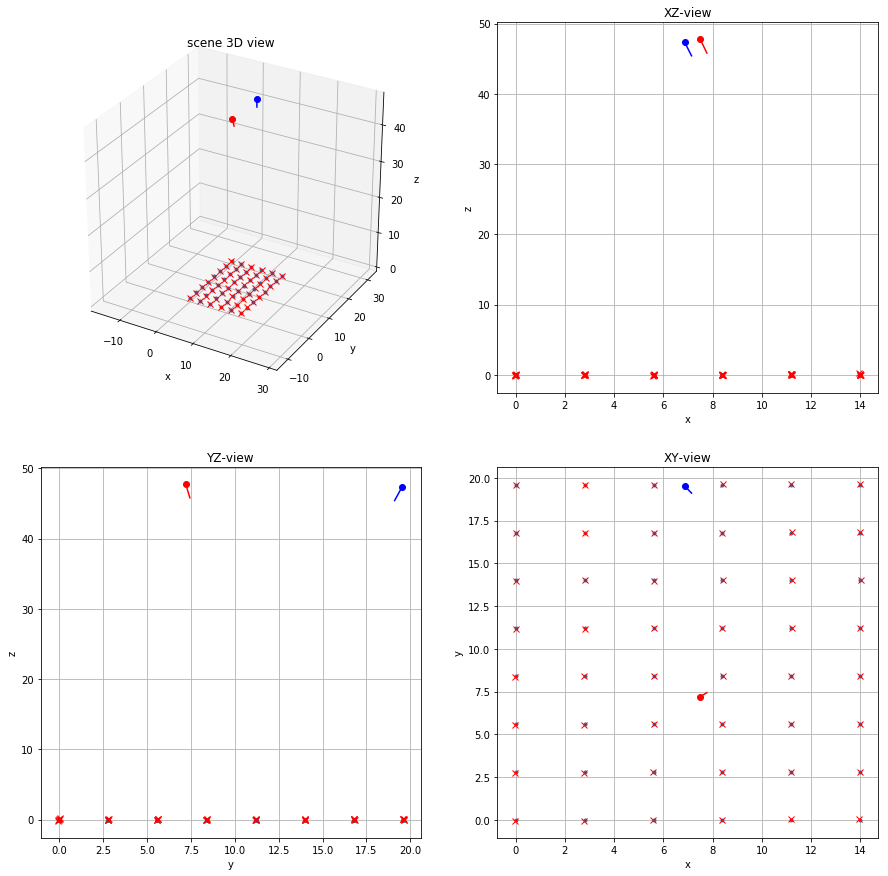

In [9]:
# generate coordinates of a line segment running from the center
# of the camera to 3 units in front of the camera
lookL = np.hstack((camL.t,camL.t+camL.R @ np.array([[0,0,2]]).T))
lookR = np.hstack((camR.t,camR.t+camR.R @ np.array([[0,0,2]]).T))

# visualize the left and right image overlaid
fig = plt.figure()
ax = fig.add_subplot(2,2,1,projection='3d')
ax.plot(pts3[0,:],pts3[1,:],pts3[2,:],'.')
ax.plot(pts3r[0,:],pts3r[1,:],pts3r[2,:],'rx')
ax.plot(camR.t[0],camR.t[1],camR.t[2],'ro')
ax.plot(camL.t[0],camL.t[1],camL.t[2],'bo')
ax.plot(lookL[0,:],lookL[1,:],lookL[2,:],'b')
ax.plot(lookR[0,:],lookR[1,:],lookR[2,:],'r')
visutils.set_axes_equal_3d(ax)
visutils.label_axes(ax)
plt.title('scene 3D view')

ax = fig.add_subplot(2,2,2)
ax.plot(pts3[0,:],pts3[2,:],'.')
ax.plot(pts3r[0,:],pts3r[2,:],'rx')
ax.plot(camR.t[0],camR.t[2],'ro')
ax.plot(camL.t[0],camL.t[2],'bo')
ax.plot(lookL[0,:],lookL[2,:],'b')
ax.plot(lookR[0,:],lookR[2,:],'r')
plt.title('XZ-view')
plt.grid()
plt.xlabel('x')
plt.ylabel('z')

ax = fig.add_subplot(2,2,3)
ax.plot(pts3[1,:],pts3[2,:],'.')
ax.plot(pts3r[1,:],pts3r[2,:],'rx')
ax.plot(camR.t[1],camR.t[2],'ro')
ax.plot(camL.t[1],camL.t[2],'bo')
ax.plot(lookL[1,:],lookL[2,:],'b')
ax.plot(lookR[1,:],lookR[2,:],'r')
plt.title('YZ-view')
plt.grid()
plt.xlabel('y')
plt.ylabel('z')

ax = fig.add_subplot(2,2,4)
ax.plot(pts3[0,:],pts3[1,:],'.')
ax.plot(pts3r[0,:],pts3r[1,:],'rx')
ax.plot(camR.t[0],camR.t[1],'ro')
ax.plot(camL.t[0],camL.t[1],'bo')
ax.plot(lookL[0,:],lookL[1,:],'b')
ax.plot(lookR[0,:],lookR[1,:],'r')
plt.title('XY-view')
plt.grid()
plt.xlabel('x')
plt.ylabel('y')

In [10]:
#finds distance between two 3d points
def dist3d(pt1, pt2):
    squared_dist = ((pt1[0]-pt2[0])**2 + (pt1[1]-pt2[1])**2 + (pt1[2]-pt2[2])**2)  
    distance = np.sqrt(squared_dist)
    return distance

#converts bool to int
def bool_to_int(v):
    if str(v) == "True":
        return 1
    elif str(v) == "False":
        return 0
    else:
        return v

#converts graycode to binary to bcd
def graytobcd(gray3d):
    bitnum = len(gray3d)
    binary = gray3d[0]
    bcd = 2**(bitnum-1) * binary
 
    for bit in range(1, bitnum):
        binary = np.logical_xor(binary, gray3d[bit])
        binary = np.vectorize(bool_to_int)(binary)
        bcd = np.add(bcd, 2**(bitnum-1-bit) * binary)
    return bcd

In [12]:
def decode(path,start,threshold,cthreshold=0.6,frame="",color=""):
    """
    Given a sequence of 20 images of a scene showing projected 10 bit gray code, 
    decode the binary sequence into a decimal value in (0,1023) for each pixel.
    Mark those pixels whose code is likely to be incorrect based on the user 
    provided threshold.  Images are assumed to be named "imageprefixN.png" where
    N is a 2 digit index (e.g., "img00.png,img01.png,img02.png...")
 
    Parameters
    ----------
    imprefix : str
       Image name prefix
      
    start : int
       Starting index
       
    threshold : float
       Threshold to determine if a bit is decodeable
       
    Returns
    -------
    code : 2D numpy.array (dtype=float)
        Array the same size as input images with entries in (0..1023)
        
    mask : 2D numpy.array (dtype=logical)
        Array indicating which pixels were correctly decoded based on the threshold
    
    """
    
    # we will assume a 10 bit code
    nbits = 10
    imgName=[]
    
    setmask = False
    precode = []
    bitstr = ""
    
    #creates correct filenames
    for num in range(20):
        if (num + start) < 10:
            imgName.append(str(path) + str(frame) + "0" + str(num + start) + ".png")
        else:
            imgName.append(str(path) + str(frame) + str(num + start)+ ".png")
    
    for nameA,nameB in zip(imgName[::2], imgName[1::2]):
        
        #image pairs are read and shape is converted to grayscale if necessary
        imgA = plt.imread(nameA)
        if (len(imgA.shape)) == 3:
            imgA = np.mean(imgA, -1) #convert to grayscale
            
        imgB = plt.imread(nameB)
        if (len(imgB.shape)) == 3:
            imgB = np.mean(imgB, -1) #convert to grayscale

        hA,wA = imgA.shape
        assert(hA == imgB.shape[0] and wA == imgB.shape[1])
        
        #mask is created
        if setmask == False:
            mask = np.ones((hA,wA))
            setmask = True
        
        #pixels where imgA is brighter appended as 1 else 0 into 2d array of image layer
        precode.append((imgA>imgB).astype(int))
        #pixels that do not satisfy difference threshold are placed on mask
        mask = np.where(abs(imgA-imgB)<threshold,0,mask)
       
    precode = np.asarray(precode)
    #precode 3d array converted to bcd 2d array
    code = graytobcd(precode)
    
    ### put color code here      
    cmask=0
    obj=""
    if color != "":
        bkg = plt.imread(str(path) + str(color) + "00.png")
        obj = plt.imread(str(path) + str(color) + "01.png")
        assert(bkg.shape[0] == obj.shape[0] and bkg.shape[1] == obj.shape[1])
        cmask = np.ones((bkg.shape[0], bkg.shape[1]))
        #red, green, blue
        bkg = np.array([bkg[:,:,2],bkg[:,:,1],bkg[:,:,0]])
        cobj = np.array([obj[:,:,2],obj[:,:,1],obj[:,:,0]])
        
        cdist = np.sqrt(bkg-cobj) 
        cdist = np.sum([cdist[0], cdist[1], cdist[2]], axis=0)
        cmask = np.where(cdist<cthreshold,0,cmask)
        
        #ch, cw = (obj.shape[1],obj.shape[2])
        #flatobj = obj.reshape(3, ch*cw)
        #print("flat shape {}".format(flatobj.shape))

    ###
      
    # don't forget to convert images to grayscale / float after loading them in
      
    return code,mask,cmask,obj


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:85: RuntimeWarning: invalid value encountered in sqrt
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in less


Box Code


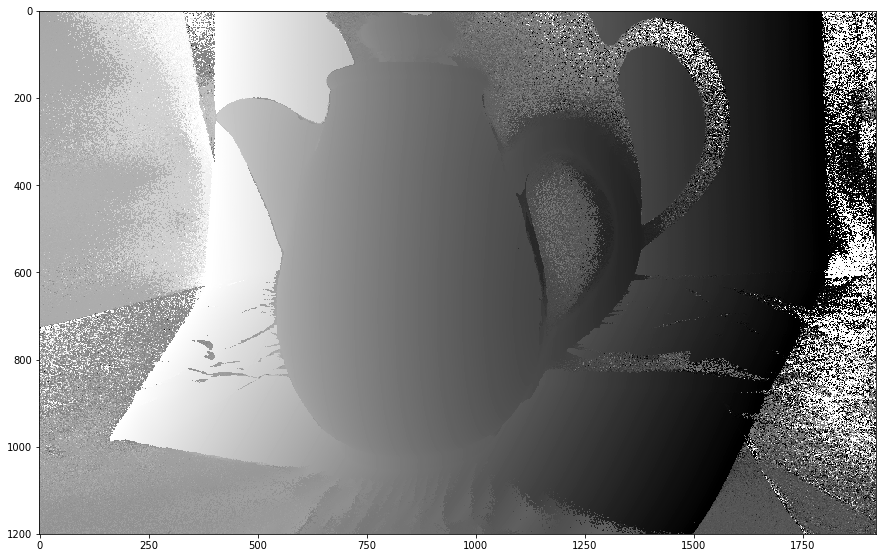

Box Mask


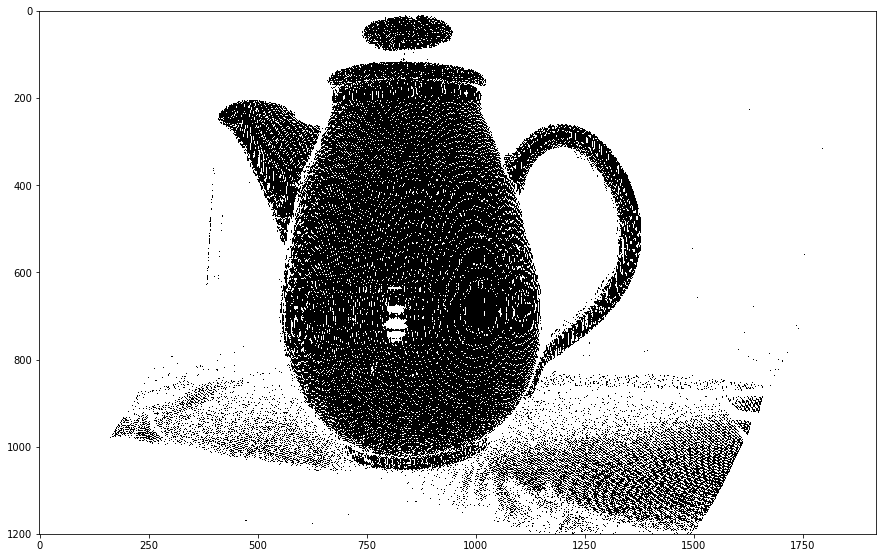

Color Mask


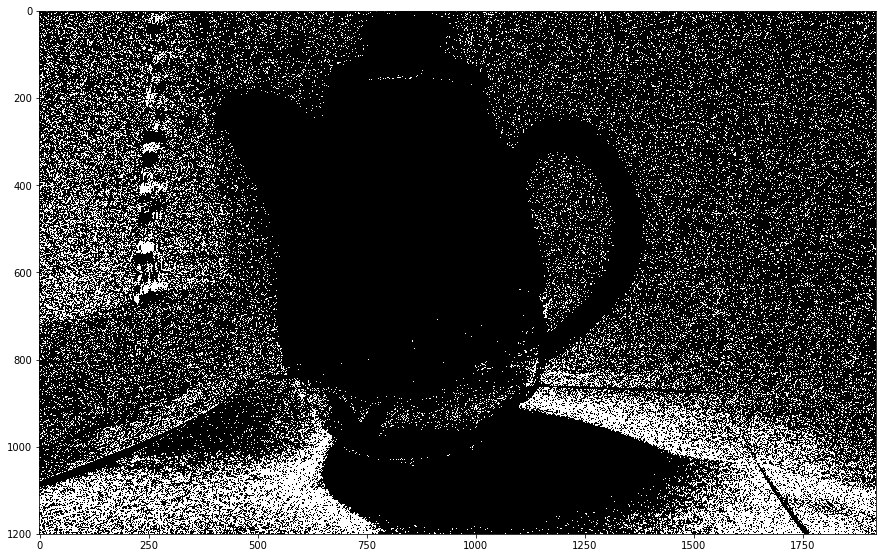

In [13]:
#
# Visualize results for the first scan and experiment to determine a good threshold
#
ffname = '/Users/gbanuru/Documents/UCI Class Folders/Spring19/CS 117/Project/grab_0_u/'
threshold = .02
cthreshold = .6
code,mask,cmask,cobj = decode(ffname,0,threshold,cthreshold,"frame_C0_","color_C0_")

# display view code and mask as images

print("Box Code")
plt.imshow(code, cmap=plt.cm.binary)
plt.show()

print("Box Mask")
plt.imshow(mask, cmap=plt.cm.binary)
plt.show()

print("Color Mask")
plt.imshow(cmask, cmap=plt.cm.binary)
plt.show()

In [14]:
def reconstruct(imprefix,threshold,cthreshold,camL,camR):
    """
    Performing matching and triangulation of points on the surface using structured
    illumination. This function decodes the binary graycode patterns, matches 
    pixels with corresponding codes, and triangulates the result.
    
    The returned arrays include 2D and 3D coordinates of only those pixels which
    were triangulated where pts3[:,i] is the 3D coordinte produced by triangulating
    pts2L[:,i] and pts2R[:,i]

    Parameters
    ----------
    imprefix, imprefix : str
        Image prefixes for the coded images from the left and right camera
        
    threshold : float
        Threshold to determine if a bit is decodeable
   
    camL,camR : Camera
        Calibration info for the left and right cameras
        
    Returns
    -------
    pts2L,pts2R : 2D numpy.array (dtype=float)
        The 2D pixel coordinates of the matched pixels in the left and right
        image stored in arrays of shape 2xN
        
    pts3 : 2D numpy.array (dtype=float)
        Triangulated 3D coordinates stored in an array of shape 3xN
        
    """
    frameL="frame_C0_"
    frameR="frame_C1_"
    fcolorL="color_C0_"
    fcolorR="color_C1_"
    
    # Decode the H and V coordinates for the two views
    H0,H0mask,H0cmask,colorR = decode(imprefix,0,threshold, cthreshold, frameR, fcolorR)
    V0,V0mask,V0cmask,colorR = decode(imprefix,20,threshold, cthreshold, frameR, fcolorR)
    
    H1,H1mask,H1cmask,colorL = decode(imprefix,0,threshold, cthreshold, frameL, fcolorL)
    V1,V1mask,V1cmask,colorL = decode(imprefix,20,threshold, cthreshold, frameL, fcolorL)
    
    h, w = H0.shape

    # Construct the combined 20 bit code C = H + 1024*V and mask for each view
    CR = H0 + 1024*V0
    CL = H1 + 1024*V1
    
    #create left and right mask
    CRmask = H0mask * V0mask * H0cmask * V0cmask
    CLmask = H1mask * V1mask * H1cmask * V1cmask
    
    #combine mask with left and right image
    CR = CR * CRmask
    CL = CL * CLmask
    
    print("right camera, full mask")
    plt.imshow(CR, cmap=plt.cm.jet)
    plt.show()
    
    print("left camera, full mask")
    plt.imshow(CL, cmap=plt.cm.jet)
    plt.show()
    
    # Find the indices of pixels in the left and right code image that 
    # have matching codes. If there are multiple matches, just
    # choose one arbitrarily.
    
    intersect, matchL, matchR = np.intersect1d(CL, CR, return_indices=True)
  
    # Let CL and CR be the flattened arrays of codes for the left and right view
    # Suppose you have computed arrays of indices matchL and matchR so that 
    # CL[matchL[i]] == CR[matchR[i]] for all i.  The code below gives one approach
    # to generating the corresponding pixel coordinates for the matched pixels.
    
    CL = CL.flatten()
    CR = CR.flatten()
    
    print("1. colorL shape: {}".format(colorL.shape))
    print("1. colorR shape: {}".format(colorR.shape))
    
    #make sure points match
    for I in range(matchL.shape[0]):
        assert(CL[matchL[I]] == CR[matchR[I]])
        
        
    xx,yy = np.meshgrid(range(w),range(h))
    xx = np.reshape(xx,(-1,1))
    yy = np.reshape(yy,(-1,1))
    pts2R = np.concatenate((xx[matchR].T,yy[matchR].T),axis=0)
    pts2L = np.concatenate((xx[matchL].T,yy[matchL].T),axis=0)
    
    # Now triangulate the points

    pts3 = triangulate(pts2L, camL, pts2R, camR)
    print("pts2L shape: {}".format(pts2L.shape))
    print("pts2R shape: {}".format(pts2R.shape))
    print("pts3 shape:  {}".format(pts3.shape))
    
    Lpoints = np.column_stack((pts2L[1], pts2L[0]))
    Lpoints = tuple((Lpoints.T[0], Lpoints.T[1]))
    
    Rpoints = np.column_stack((pts2R[1], pts2R[0]))
    Rpoints = tuple((Rpoints.T[0], Rpoints.T[1]))

    colorL = colorL[Lpoints] 
    colorR = colorR[Rpoints]
    
    colorMean = (colorL + colorR)/2
    
    print("4. colorL shape: {}".format(colorL.shape))
    print("4. colorR shape: {}".format(colorR.shape))
    print("colorMean shape: {}".format(colorMean.shape))
    
    return pts2L,pts2R,pts3,colorMean

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:85: RuntimeWarning: invalid value encountered in sqrt
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in less


right camera, full mask


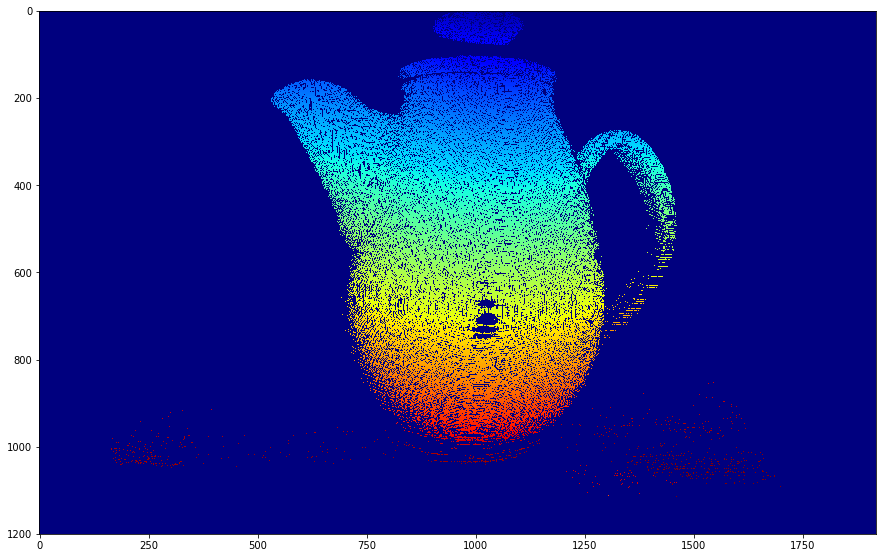

left camera, full mask


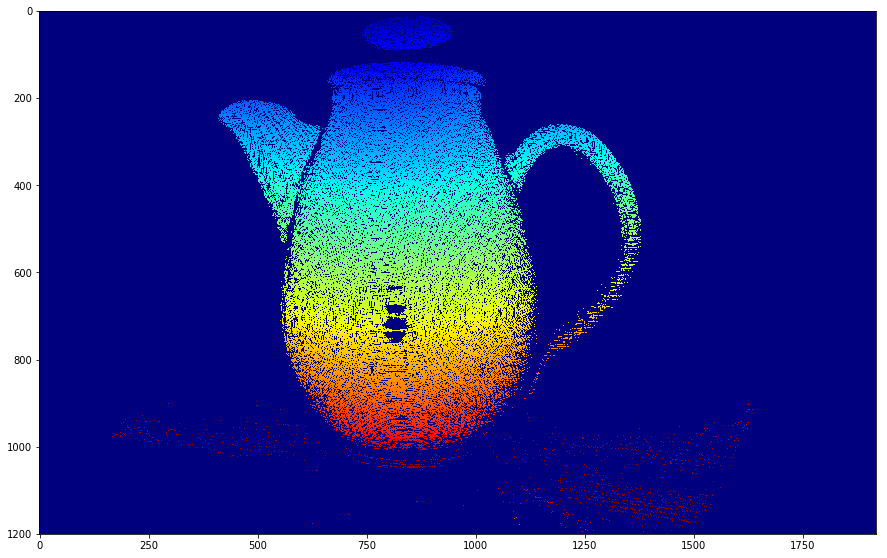

1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 178090)
pts2R shape: (2, 178090)
pts3 shape:  (3, 178090)
4. colorL shape: (178090, 3)
4. colorR shape: (178090, 3)
colorMean shape: (178090, 3)


In [17]:
#
# Reconstruct and visualize the results
#
imprefix ='/Users/gbanuru/Documents/UCI Class Folders/Spring19/CS 117/Project/grab_0_u/'
threshold = .02
cthreshold = 0.6
pts2L,pts2R,pts3,color = reconstruct(imprefix,threshold,cthreshold,camL,camR)

<IPython.core.display.Javascript object>


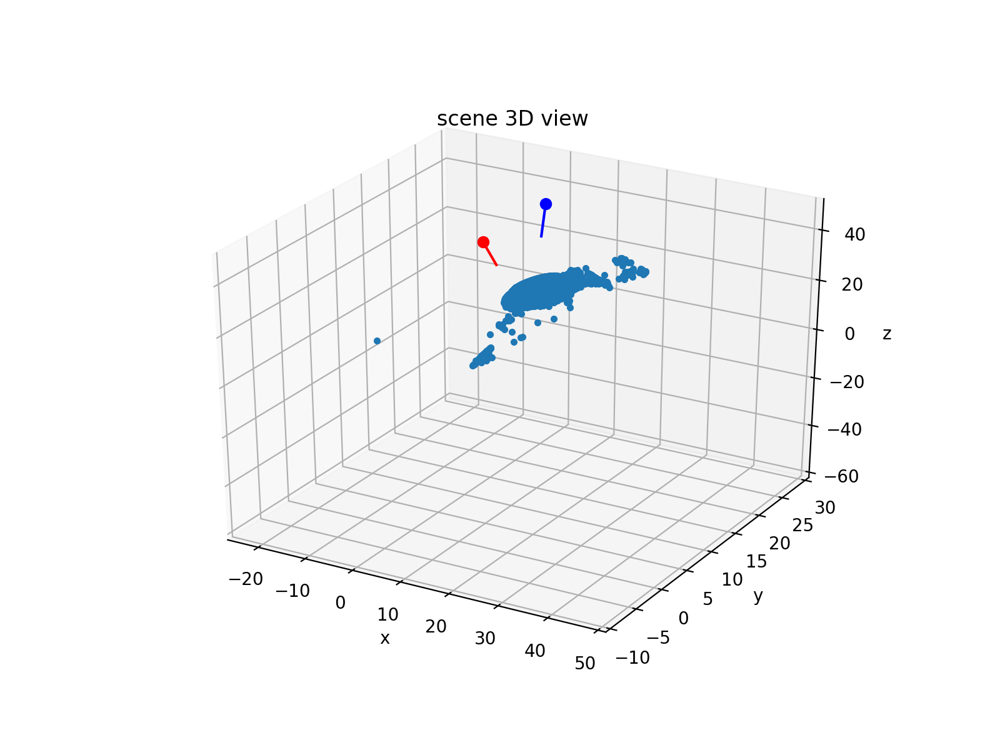

<IPython.core.display.Javascript object>


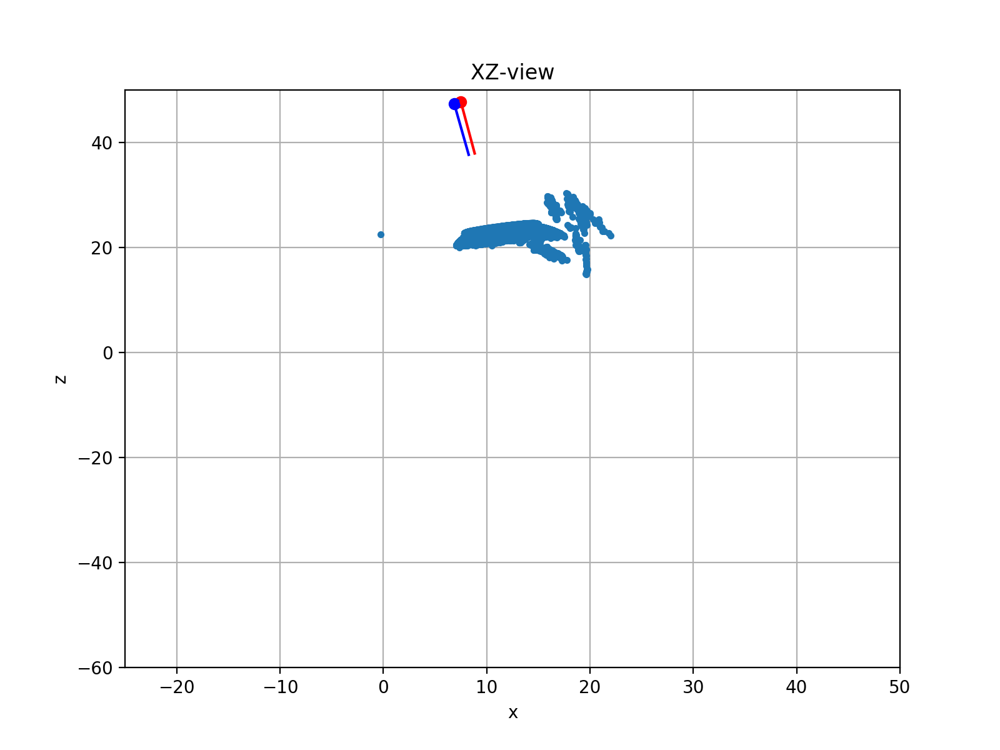

<IPython.core.display.Javascript object>


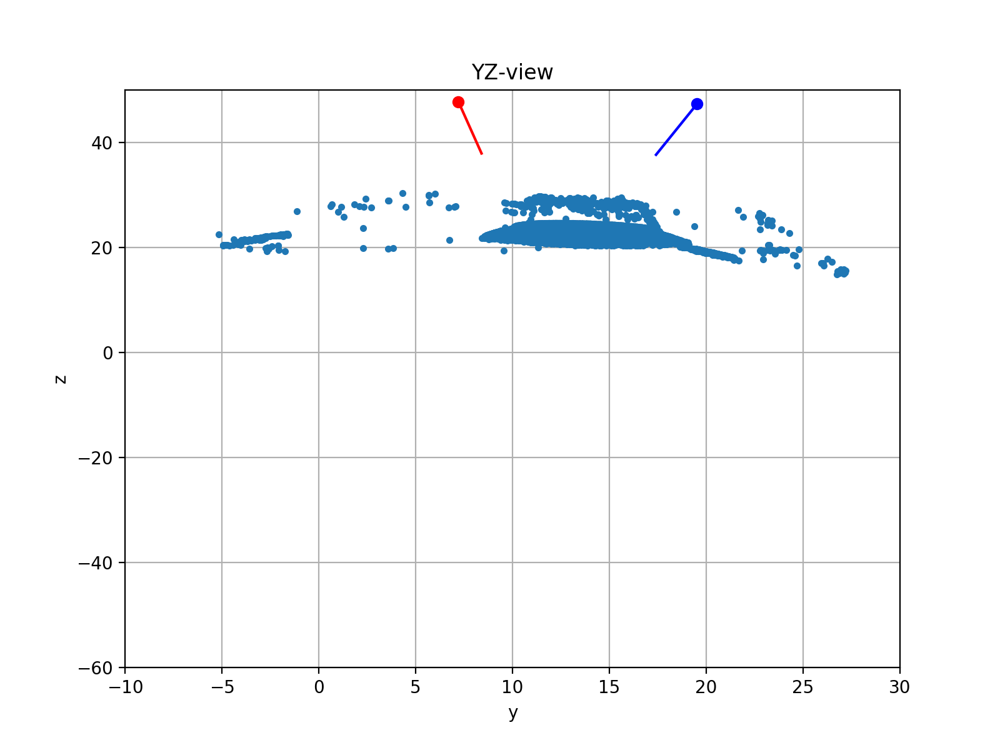

<IPython.core.display.Javascript object>


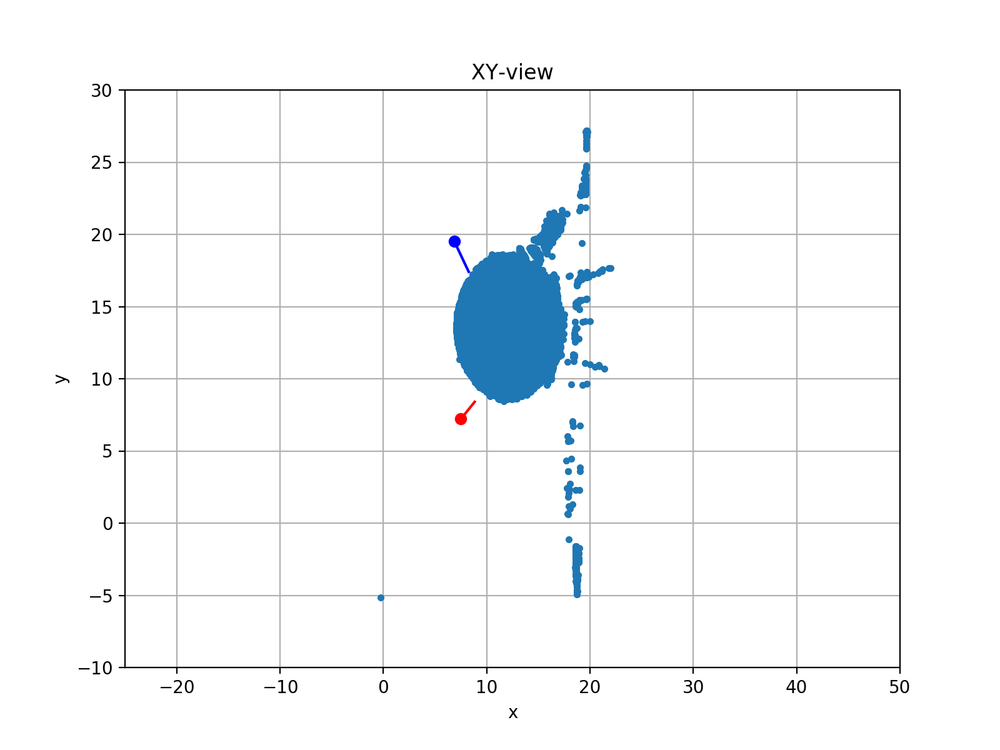

In [33]:
# Add your visualization code here.  As we have done previously it is good to visualize different
# 2D projections XY, XZ, YZ and well as a 3D version

# generate coordinates of a line segment running from the center
# of the camera to 3 units in front of the camera

lookL = np.hstack((camL.t,camL.t+camL.R @ np.array([[0,0,10]]).T))
lookR = np.hstack((camR.t,camR.t+camR.R @ np.array([[0,0,10]]).T))

#plot limits
xmin = -25
xmax = 50
ymin = -10
ymax = 30
zmin = -60
zmax = 50

# visualize the left and right image overlaid
%matplotlib notebook
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1,projection='3d')
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])
ax.set_zlim([zmin,zmax])
ax.plot(pts3[0,:],pts3[1,:],pts3[2,:],'.')
ax.plot(camR.t[0],camR.t[1],camR.t[2],'ro')
ax.plot(camL.t[0],camL.t[1],camL.t[2],'bo')
ax.plot(lookL[0,:],lookL[1,:],lookL[2,:],'b')
ax.plot(lookR[0,:],lookR[1,:],lookR[2,:],'r')
#visutils.set_axes_equal_3d(ax)
visutils.label_axes(ax)
plt.title('scene 3D view')
plt.show()

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlim([xmin,xmax])
ax.set_ylim([zmin,zmax])
ax.plot(pts3[0,:],pts3[2,:],'.')
ax.axis([xmin,xmax,zmin,zmax])
ax.plot(camR.t[0],camR.t[2],'ro')
ax.plot(camL.t[0],camL.t[2],'bo')
ax.plot(lookL[0,:],lookL[2,:],'b')
ax.plot(lookR[0,:],lookR[2,:],'r')
plt.title('XZ-view')
plt.grid()
plt.xlabel('x')
plt.ylabel('z')
plt.show()

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlim([ymin,ymax])
ax.set_ylim([zmin,zmax])
ax.plot(pts3[1,:],pts3[2,:],'.')
ax.axis([ymin, ymax, zmin, zmax])
ax.plot(camR.t[1],camR.t[2],'ro')
ax.plot(camL.t[1],camL.t[2],'bo')
ax.plot(lookL[1,:],lookL[2,:],'b')
ax.plot(lookR[1,:],lookR[2,:],'r')
plt.title('YZ-view')
plt.grid()
plt.xlabel('y')
plt.ylabel('z')
plt.show()


fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlim([xmin,xmax])
ax.set_ylim([ymin,ymax])
ax.plot(pts3[0,:],pts3[1,:],'.')
ax.axis([xmin, xmax, ymin, ymax])
ax.plot(camR.t[0],camR.t[1],'ro')
ax.plot(camL.t[0],camL.t[1],'bo')
ax.plot(lookL[0,:],lookL[1,:],'b')
ax.plot(lookR[0,:],lookR[1,:],'r')
plt.title('XY-view')
plt.grid()
plt.xlabel('x')
plt.ylabel('y')
plt.show()


In [34]:
def make_mesh(path,threshold,cthreshold,boxlimits,store,camL,camR):
    """
    Creates a mesh of the points in the point cloud and uses bounding box/triangle 
    pruning to remove extraneous points from the mesh. Returns pts3 and the mesh 
    array tri.simplices. make_mesh() saves the mesh data as a .ply file to be used 
    in meshlab.
    """  
    
    pts2L,pts2R,pts3,color = reconstruct(path,threshold,cthreshold,camL,camR)

    # Mesh cleanup parameters

    # Specify limits along the x,y and z axis of a box containing the object
    # we will prune out triangulated points outside these limits
    
    #boxlimits = np.array([-75,225,-200,150,-180,-50])

    # Specify a longest allowed edge that can appear in the mesh. Remove triangles
    # from the final mesh that have edges longer than this value
    trithresh = 2


    #
    # bounding box pruning
    #
    pts3bb = pts3.T
    pts2bb = pts2L.T
  
    print("1. pts3bb Shape: {}".format(pts3bb.shape))
    print("1. pts2bb Shape: {}".format(pts2bb.shape))
    print("1. color Shape: {}".format(color.shape))

    bbindex = []
    bbcount = 0

    #points in pts3bb not satisfying boxlimits have indices collected
    for enum, s in enumerate(pts3bb):
        if not ((s[0] >= boxlimits[0]) and (s[0] <= boxlimits[1])\
            and (s[1] >= boxlimits[2]) and (s[1] <= boxlimits[3])\
            and (s[2] >= boxlimits[4]) and (s[2] <= boxlimits[5])):
            bbindex.append(enum)
            bbcount += 1

    bbindex = np.array(bbindex).flatten()

    #remove points that do not satisfy boxlimits
    pts2bb = np.delete(pts2bb, bbindex, 0)
    pts3bb = np.delete(pts3bb, bbindex, 0)
    
    color = np.delete(color, bbindex, 0)
    
    print("2. pts2bb Shape: {}".format(pts2bb.shape))

    #
    # triangulate the 2D points to get the surface mesh
    #
    tri = Delaunay(pts2bb)

    #
    # triangle pruning
    #

    tpindex = []
    tpcount = 0
    #triangles in tri with edge greater than trithresh have indices collected
    for enum2, t in enumerate(tri.simplices):
        len1 = dist3d(pts3bb[t[0]], pts3bb[t[1]]) 
        len2 = dist3d(pts3bb[t[1]], pts3bb[t[2]]) 
        len3 = dist3d(pts3bb[t[0]], pts3bb[t[2]]) 

        if len1 > trithresh or len2 > trithresh or len3 > trithresh:
            tpindex.append(t[0])
            tpindex.append(t[1])
            tpindex.append(t[2])
            tpcount += 1


    tpindex = np.array(tpindex).flatten()
    #remove points that do not satisfy trithresh
    pts2bb = np.delete(pts2bb, tpindex, 0)
    pts3bb = np.delete(pts3bb, tpindex, 0)
    
    color = np.delete(color, tpindex, 0)
    print("3. pts2bb Shape: {}".format(pts2bb.shape))

    #
    # remove any points which are not refenced in any triangle
    #
    tri = Delaunay(pts2bb)
    
    
    print("Pre Final color Shape: {}".format(color.shape))
    #convert to red,green,blue and change shape from (Nx3) to (3xN)
    color = np.array([color[:,2],color[:,1],color[:,0]])
    #limit values between 0 and 1
    color = color/255
    
    print("Final Color Shape", color.shape)
    
    writeply(pts3bb.T,color,tri.simplices,store+".ply")
    
    return tri, pts3bb

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:85: RuntimeWarning: invalid value encountered in sqrt
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:87: RuntimeWarning: invalid value encountered in less


1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 178090)
pts2R shape: (2, 178090)
pts3 shape:  (3, 178090)
4. colorL shape: (178090, 3)
4. colorR shape: (178090, 3)
colorMean shape: (178090, 3)
1. pts3bb Shape: (178090, 3)
1. pts2bb Shape: (178090, 2)
1. color Shape: (178090, 3)
2. pts2bb Shape: (177533, 2)
3. pts2bb Shape: (177137, 2)
Pre Final color Shape: (177137, 3)
Final Color Shape (3, 177137)


<IPython.core.display.Javascript object>


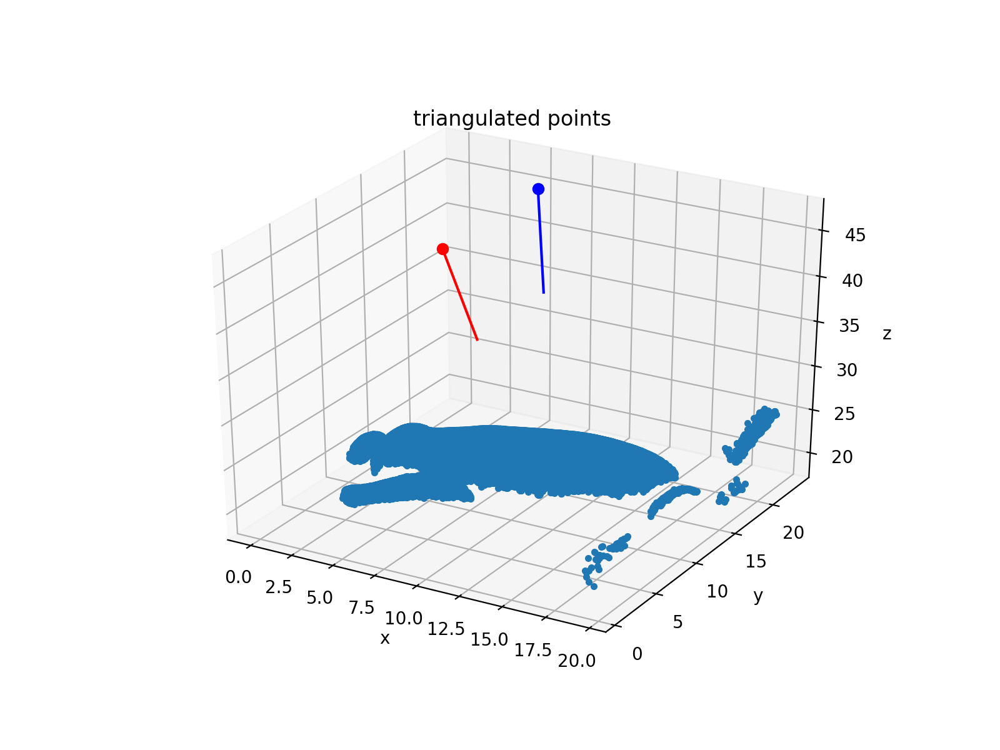

<IPython.core.display.Javascript object>


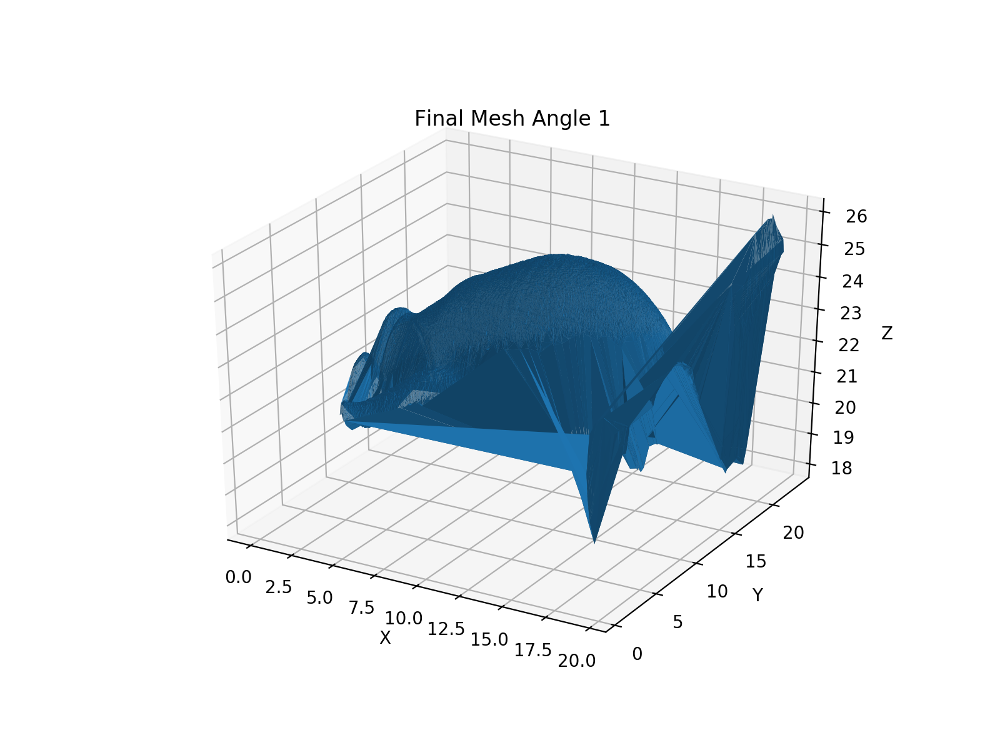

<IPython.core.display.Javascript object>


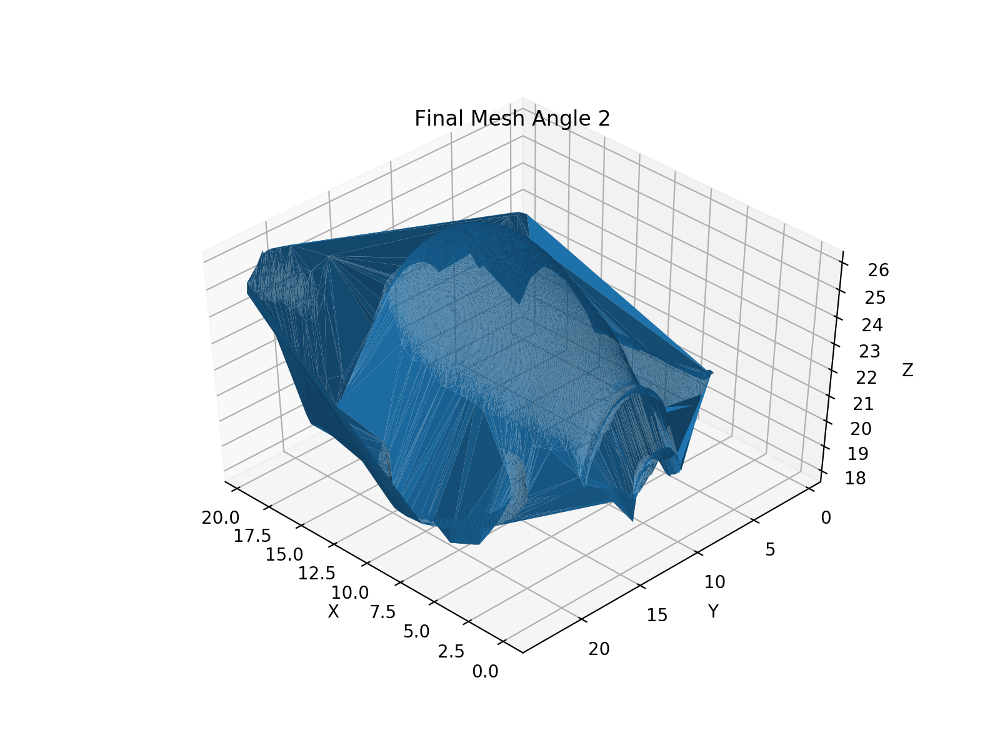

1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 151625)
pts2R shape: (2, 151625)
pts3 shape:  (3, 151625)
4. colorL shape: (151625, 3)
4. colorR shape: (151625, 3)
colorMean shape: (151625, 3)
1. pts3bb Shape: (151625, 3)
1. pts2bb Shape: (151625, 2)
1. color Shape: (151625, 3)
2. pts2bb Shape: (151192, 2)
3. pts2bb Shape: (150351, 2)
Pre Final color Shape: (150351, 3)
Final Color Shape (3, 150351)


<IPython.core.display.Javascript object>


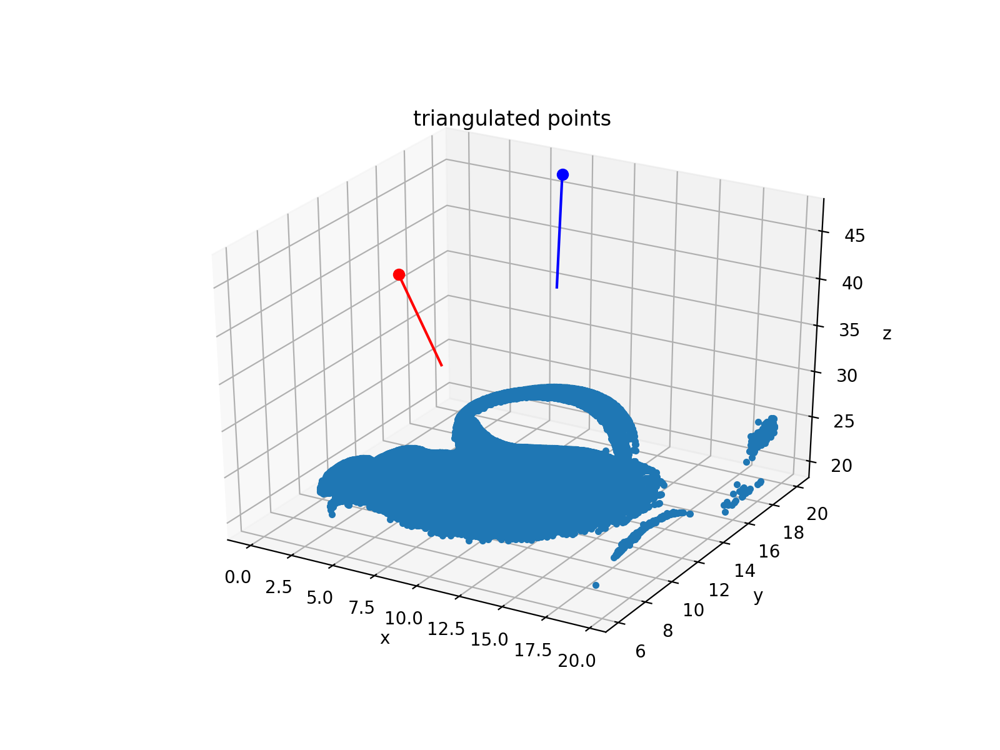

<IPython.core.display.Javascript object>


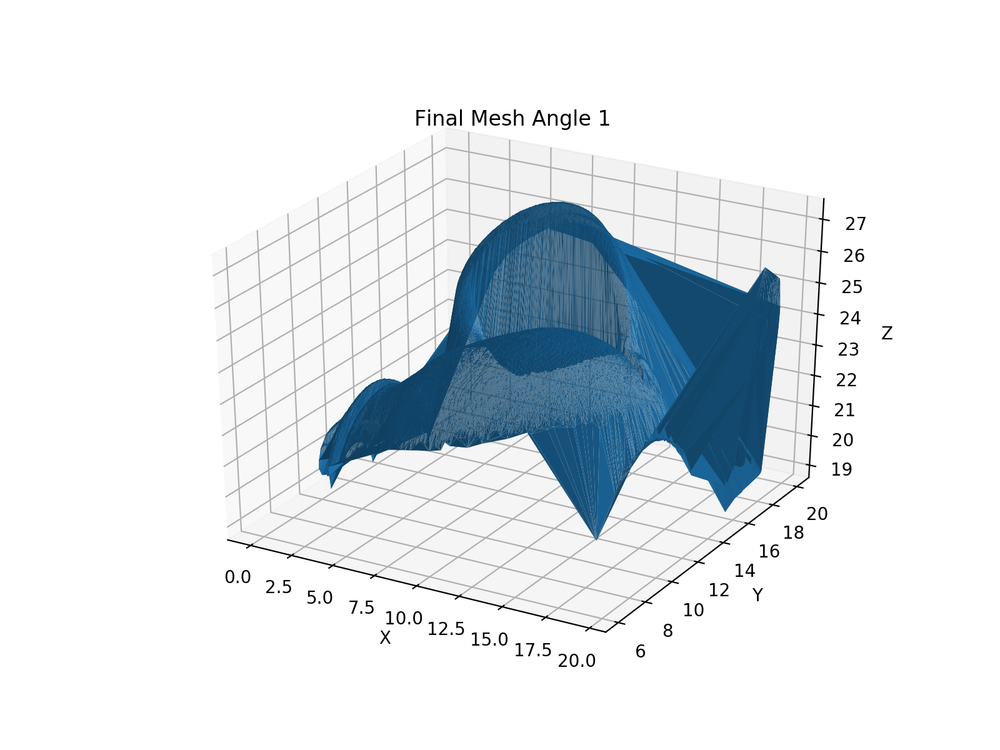

<IPython.core.display.Javascript object>


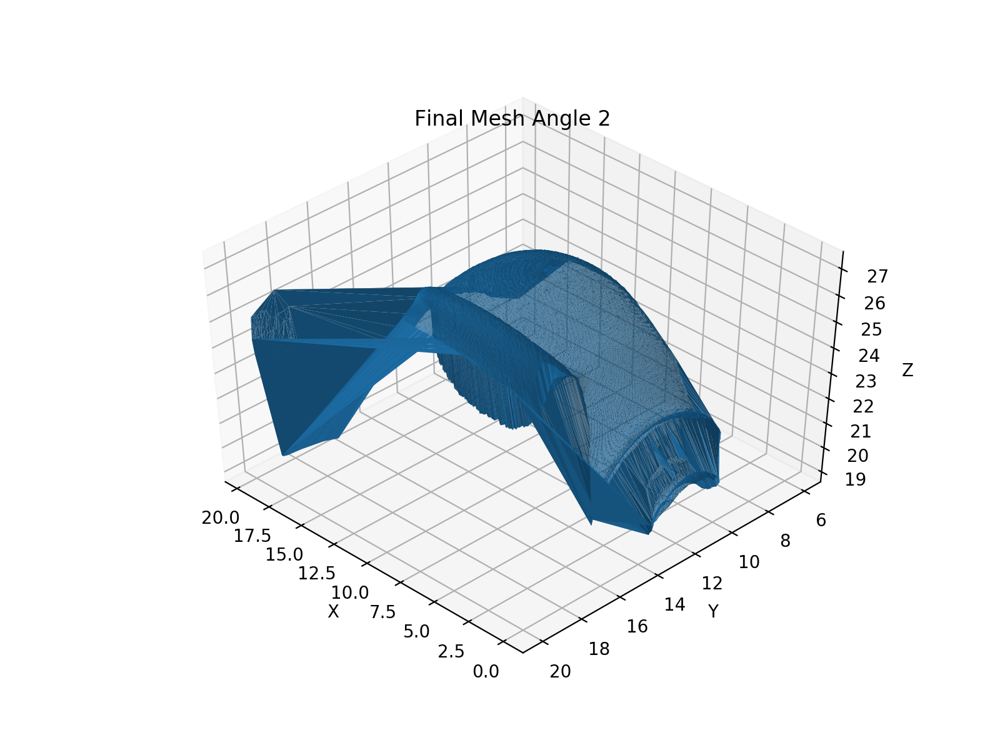

1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 172693)
pts2R shape: (2, 172693)
pts3 shape:  (3, 172693)
4. colorL shape: (172693, 3)
4. colorR shape: (172693, 3)
colorMean shape: (172693, 3)
1. pts3bb Shape: (172693, 3)
1. pts2bb Shape: (172693, 2)
1. color Shape: (172693, 3)
2. pts2bb Shape: (172176, 2)
3. pts2bb Shape: (171847, 2)
Pre Final color Shape: (171847, 3)
Final Color Shape (3, 171847)


<IPython.core.display.Javascript object>


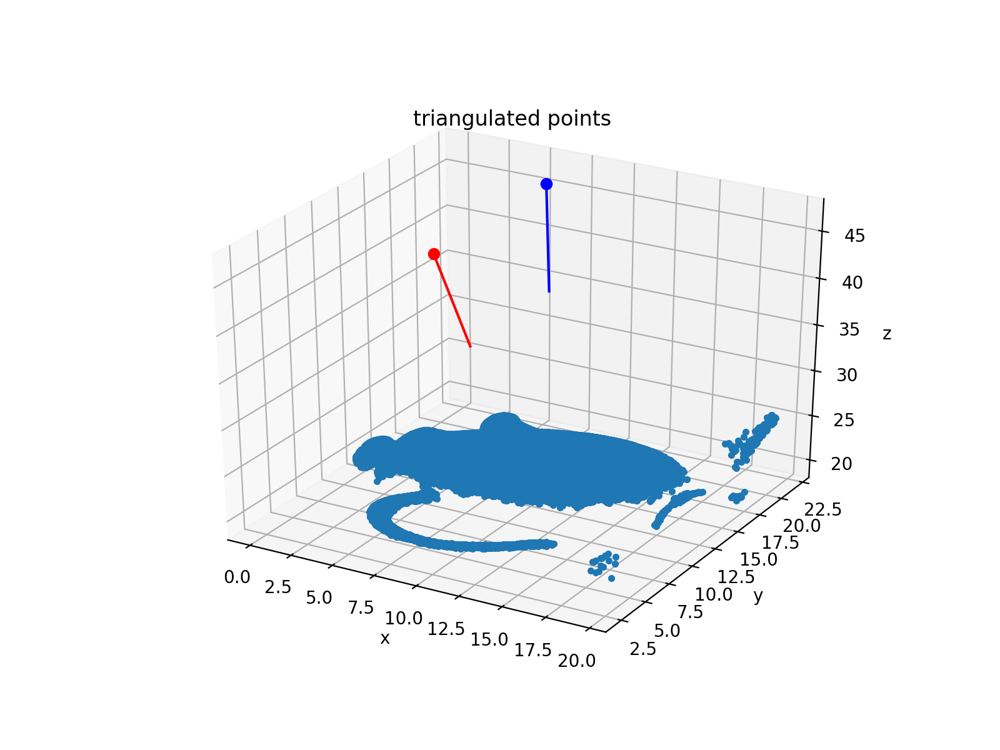

<IPython.core.display.Javascript object>


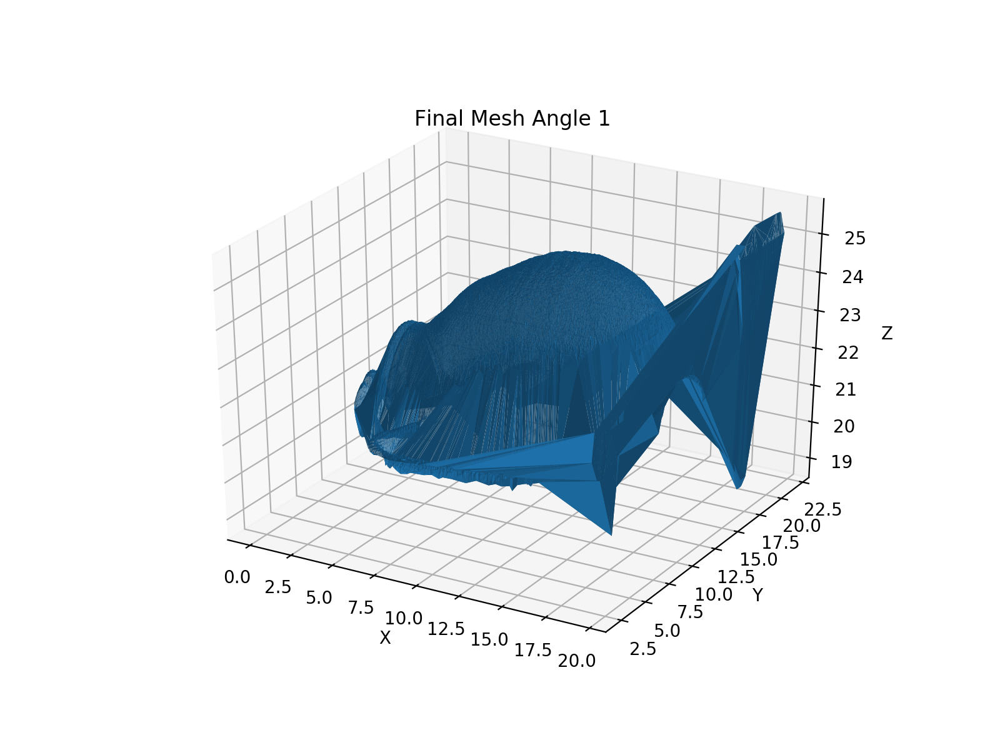

<IPython.core.display.Javascript object>


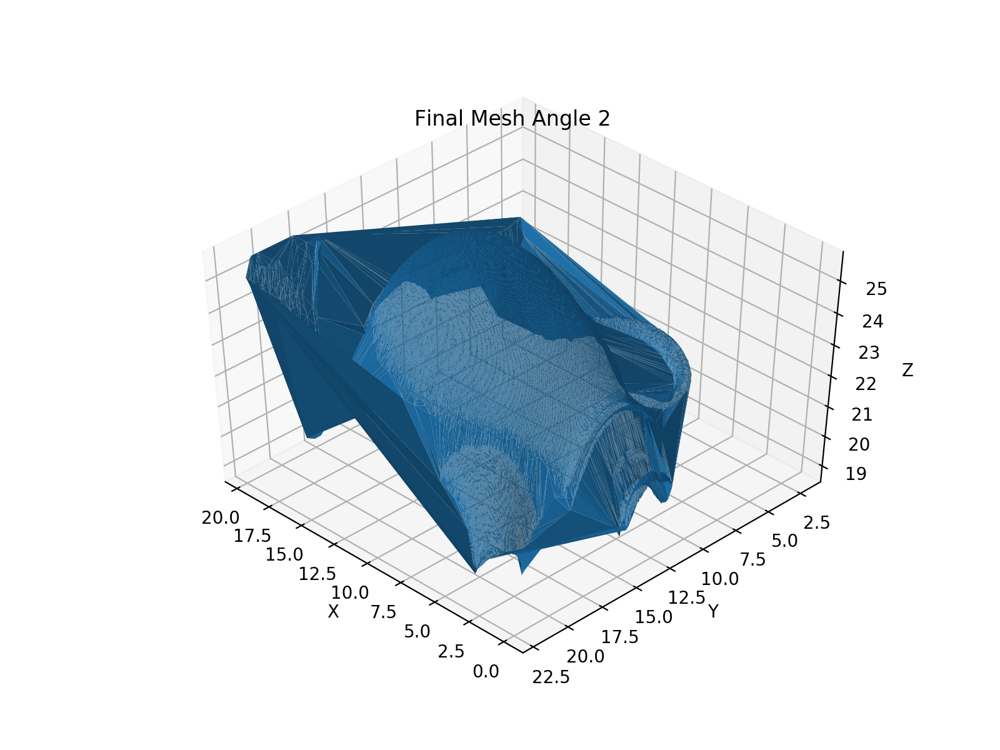

1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 51677)
pts2R shape: (2, 51677)
pts3 shape:  (3, 51677)
4. colorL shape: (51677, 3)
4. colorR shape: (51677, 3)
colorMean shape: (51677, 3)
1. pts3bb Shape: (51677, 3)
1. pts2bb Shape: (51677, 2)
1. color Shape: (51677, 3)
2. pts2bb Shape: (51399, 2)
3. pts2bb Shape: (51152, 2)
Pre Final color Shape: (51152, 3)
Final Color Shape (3, 51152)


<IPython.core.display.Javascript object>


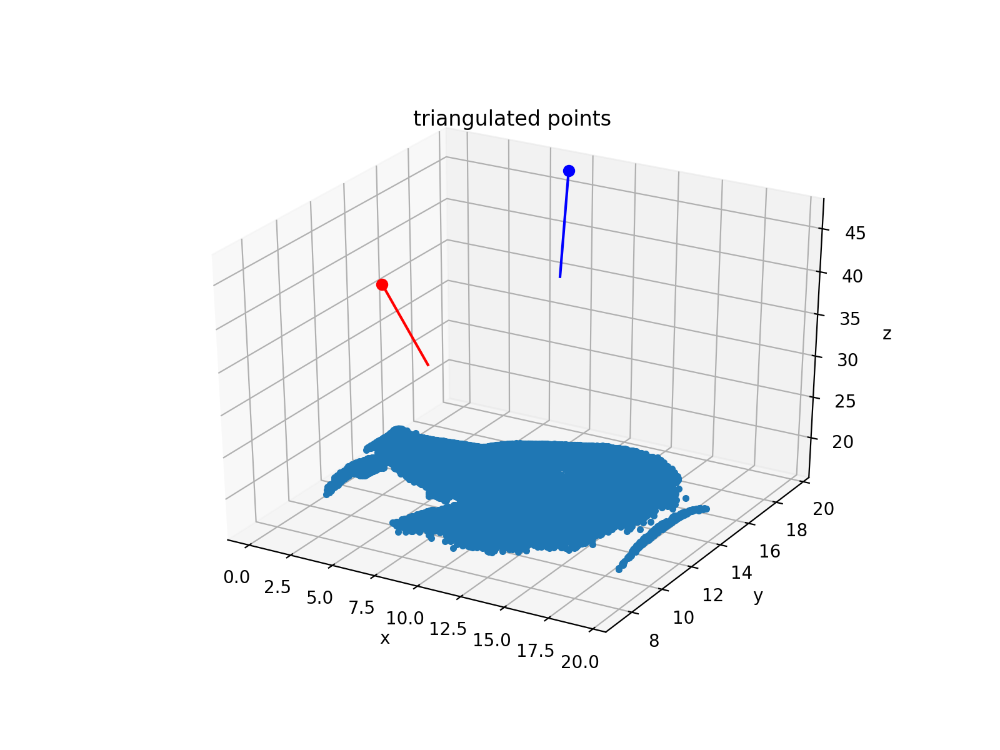

<IPython.core.display.Javascript object>


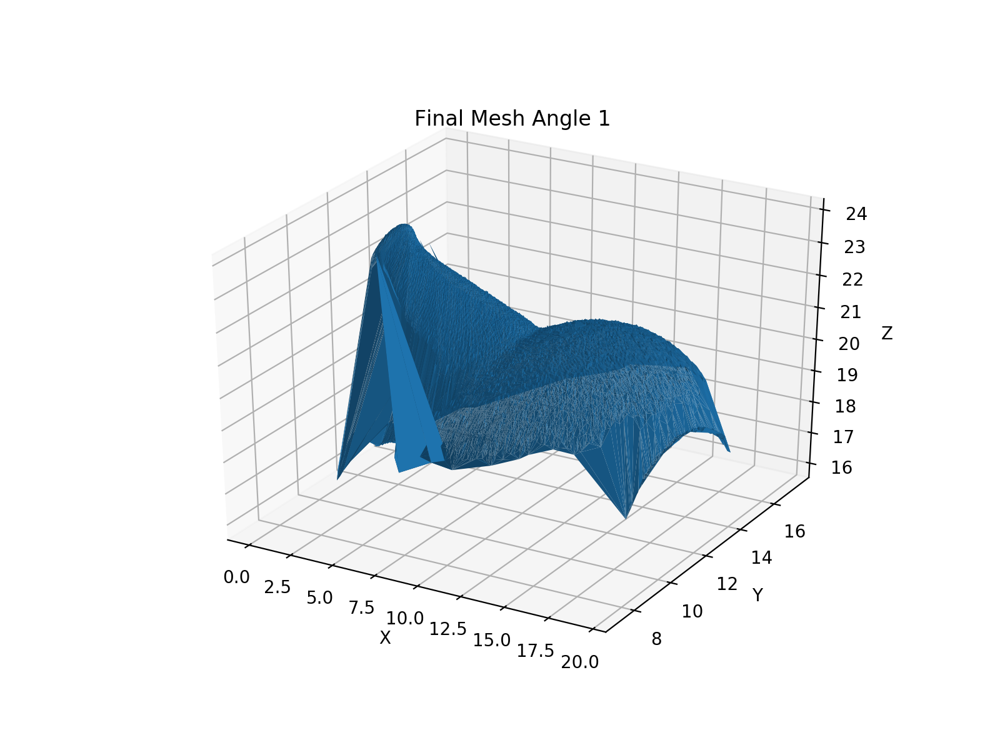

<IPython.core.display.Javascript object>


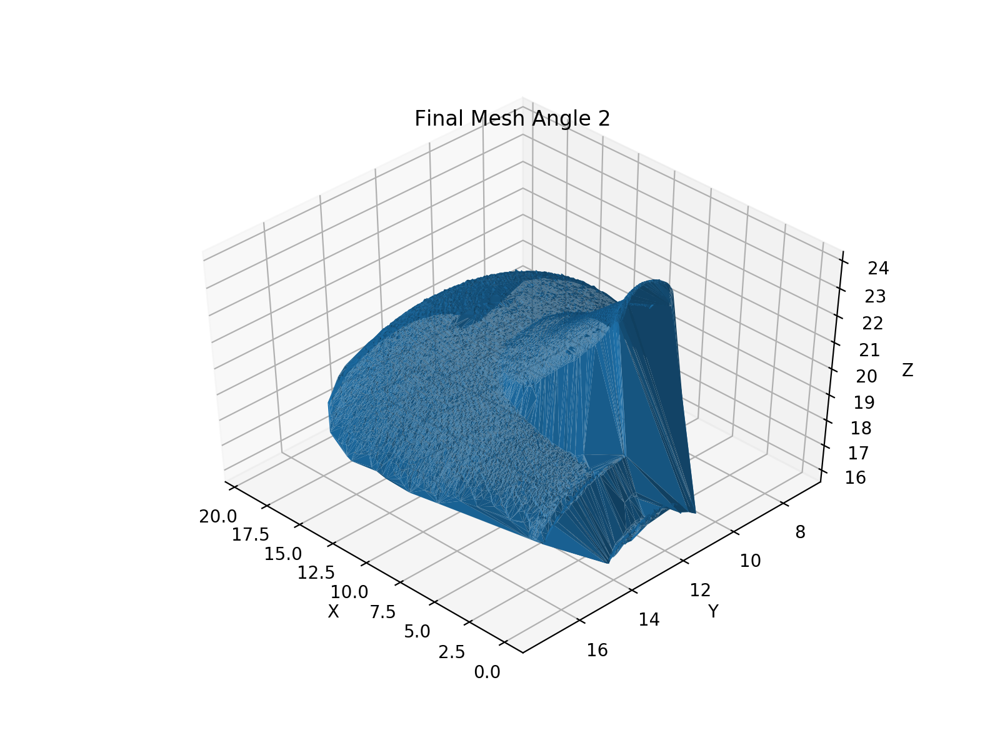

1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 153860)
pts2R shape: (2, 153860)
pts3 shape:  (3, 153860)
4. colorL shape: (153860, 3)
4. colorR shape: (153860, 3)
colorMean shape: (153860, 3)
1. pts3bb Shape: (153860, 3)
1. pts2bb Shape: (153860, 2)
1. color Shape: (153860, 3)
2. pts2bb Shape: (153452, 2)
3. pts2bb Shape: (153040, 2)
Pre Final color Shape: (153040, 3)
Final Color Shape (3, 153040)


<IPython.core.display.Javascript object>


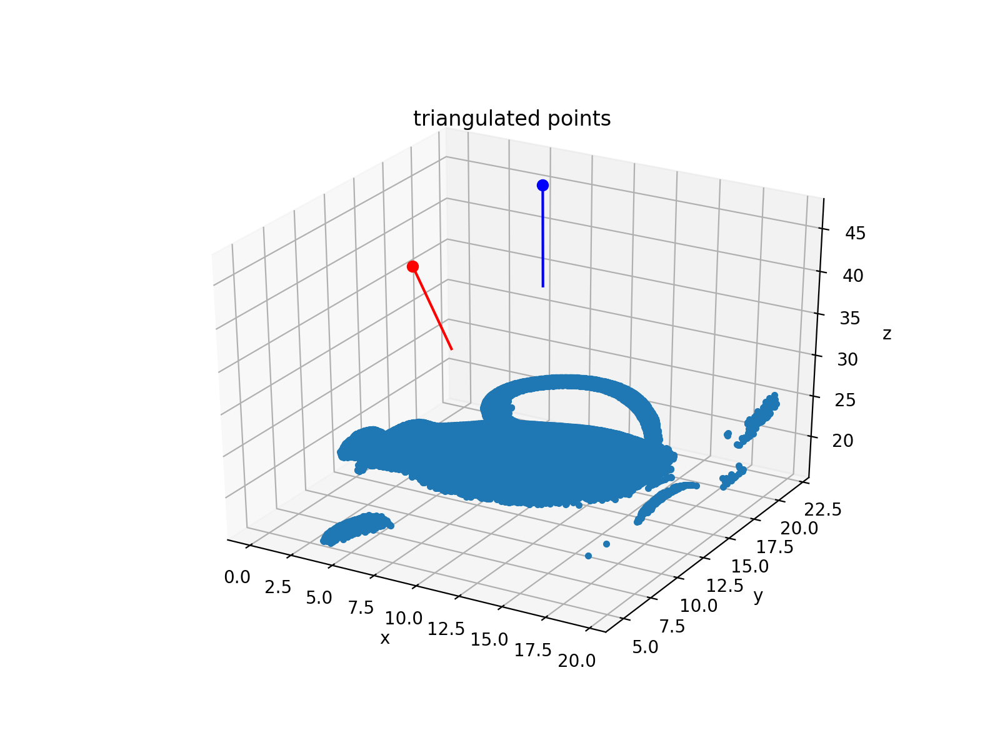

<IPython.core.display.Javascript object>


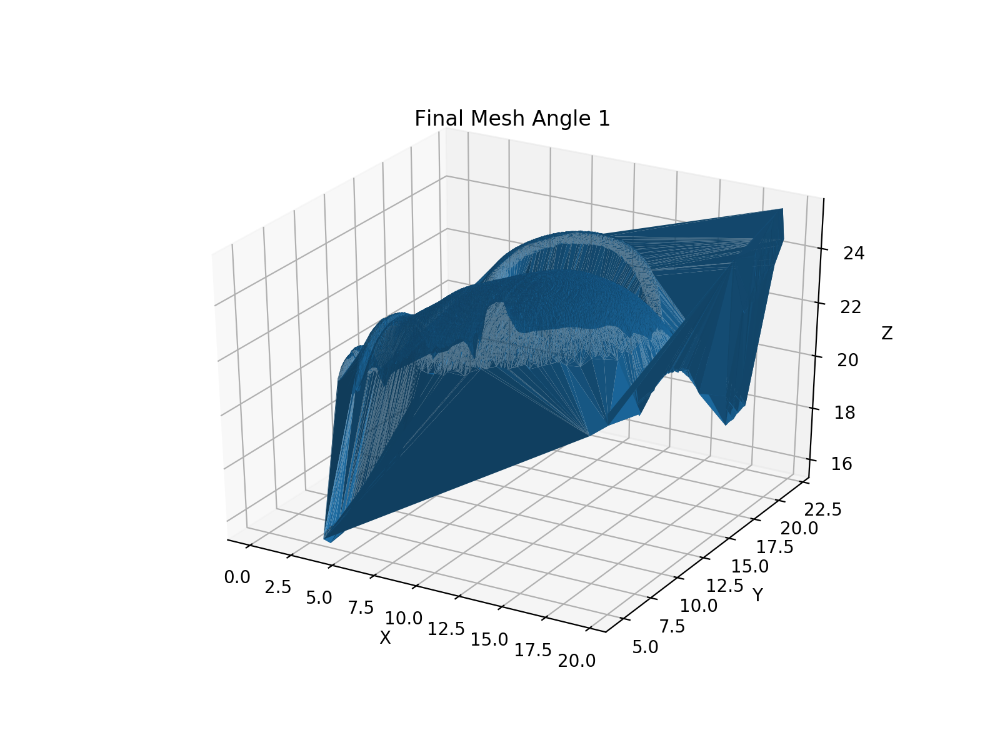

<IPython.core.display.Javascript object>


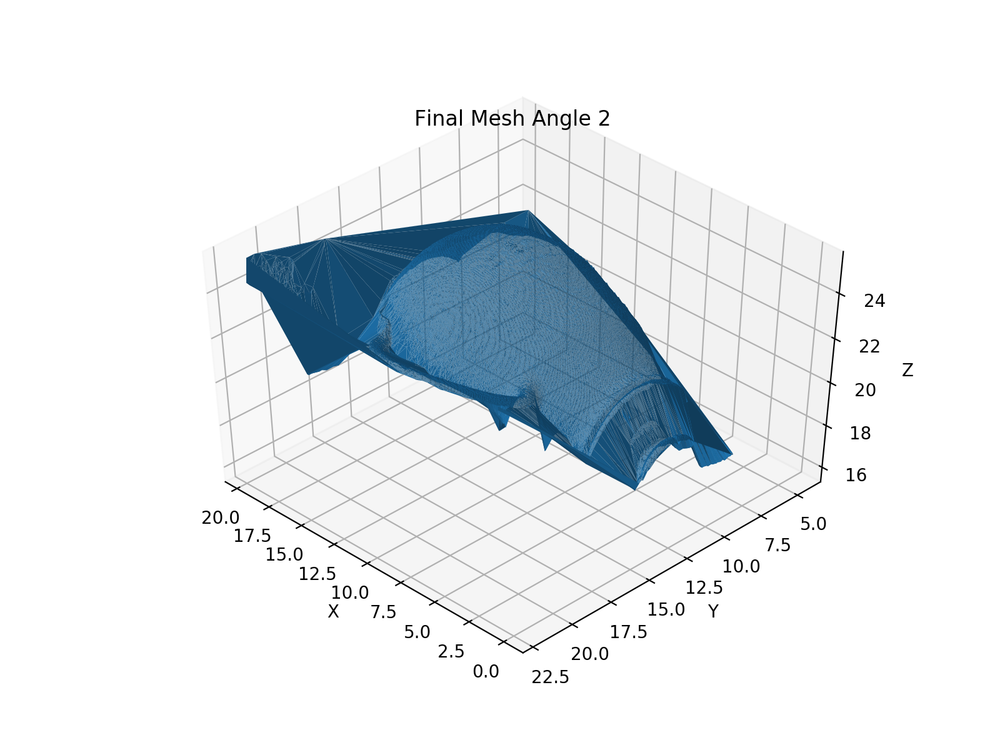

1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 42793)
pts2R shape: (2, 42793)
pts3 shape:  (3, 42793)
4. colorL shape: (42793, 3)
4. colorR shape: (42793, 3)
colorMean shape: (42793, 3)
1. pts3bb Shape: (42793, 3)
1. pts2bb Shape: (42793, 2)
1. color Shape: (42793, 3)
2. pts2bb Shape: (42326, 2)
3. pts2bb Shape: (41930, 2)
Pre Final color Shape: (41930, 3)
Final Color Shape (3, 41930)


<IPython.core.display.Javascript object>


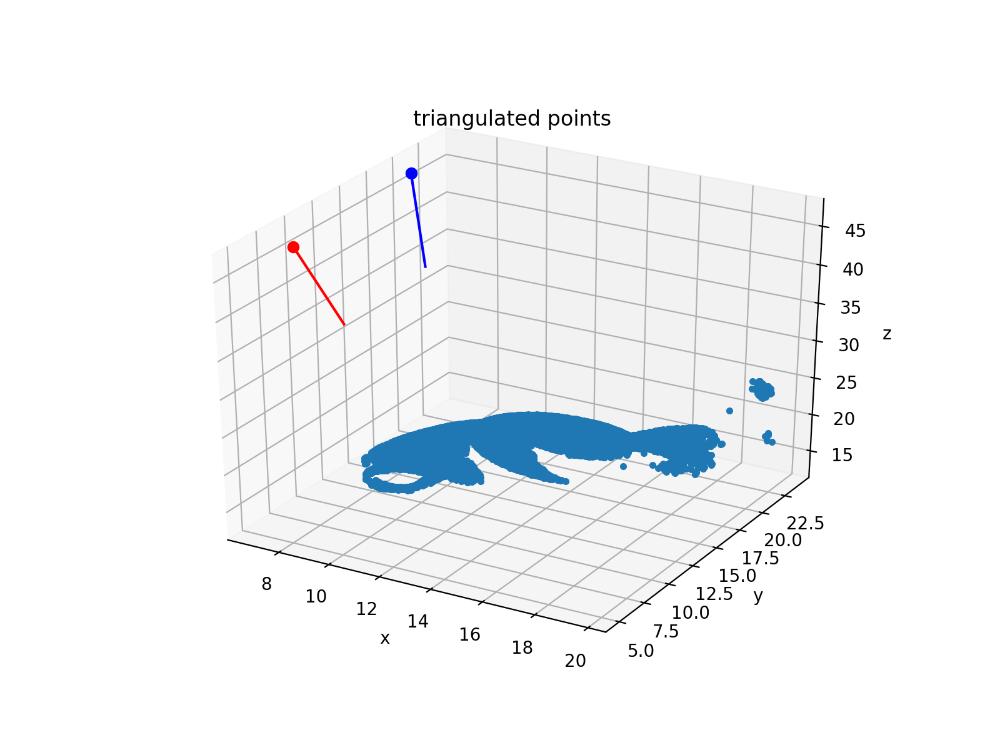

<IPython.core.display.Javascript object>


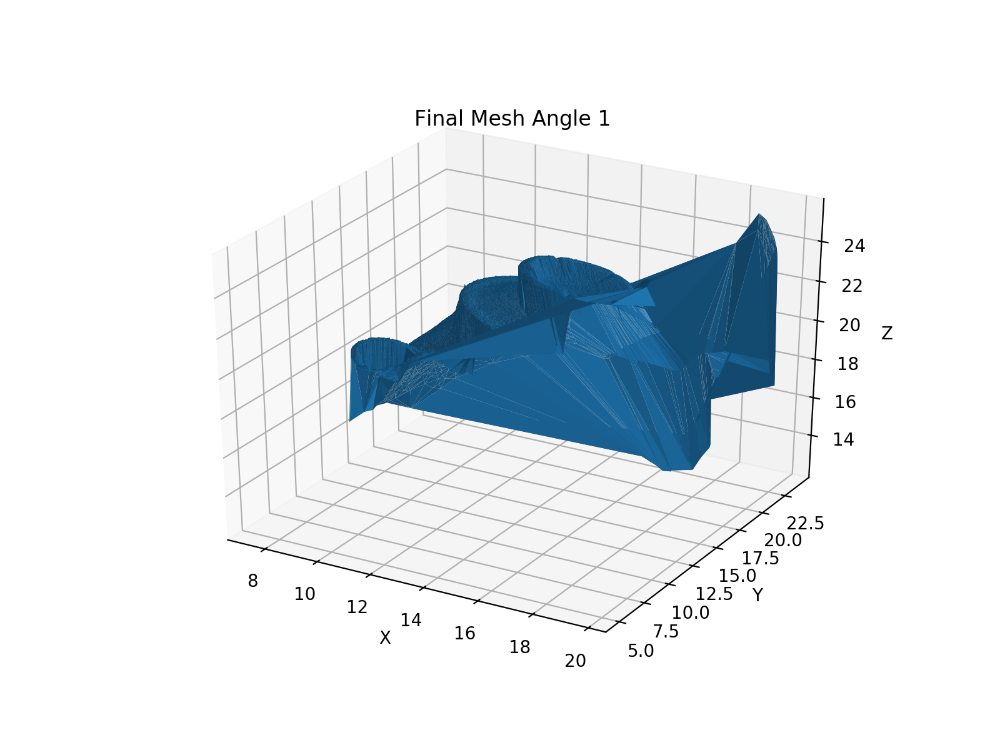

<IPython.core.display.Javascript object>


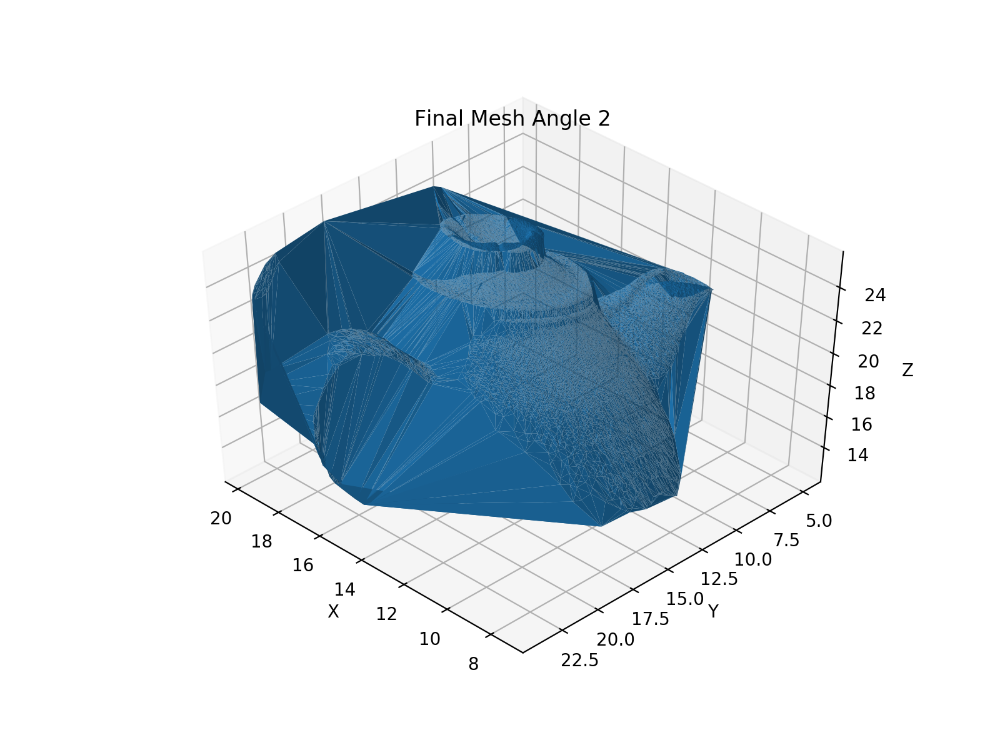

1. colorL shape: (1200, 1920, 3)
1. colorR shape: (1200, 1920, 3)
pts2L shape: (2, 72485)
pts2R shape: (2, 72485)
pts3 shape:  (3, 72485)
4. colorL shape: (72485, 3)
4. colorR shape: (72485, 3)
colorMean shape: (72485, 3)
1. pts3bb Shape: (72485, 3)
1. pts2bb Shape: (72485, 2)
1. color Shape: (72485, 3)
2. pts2bb Shape: (72248, 2)
3. pts2bb Shape: (71646, 2)
Pre Final color Shape: (71646, 3)
Final Color Shape (3, 71646)


<IPython.core.display.Javascript object>


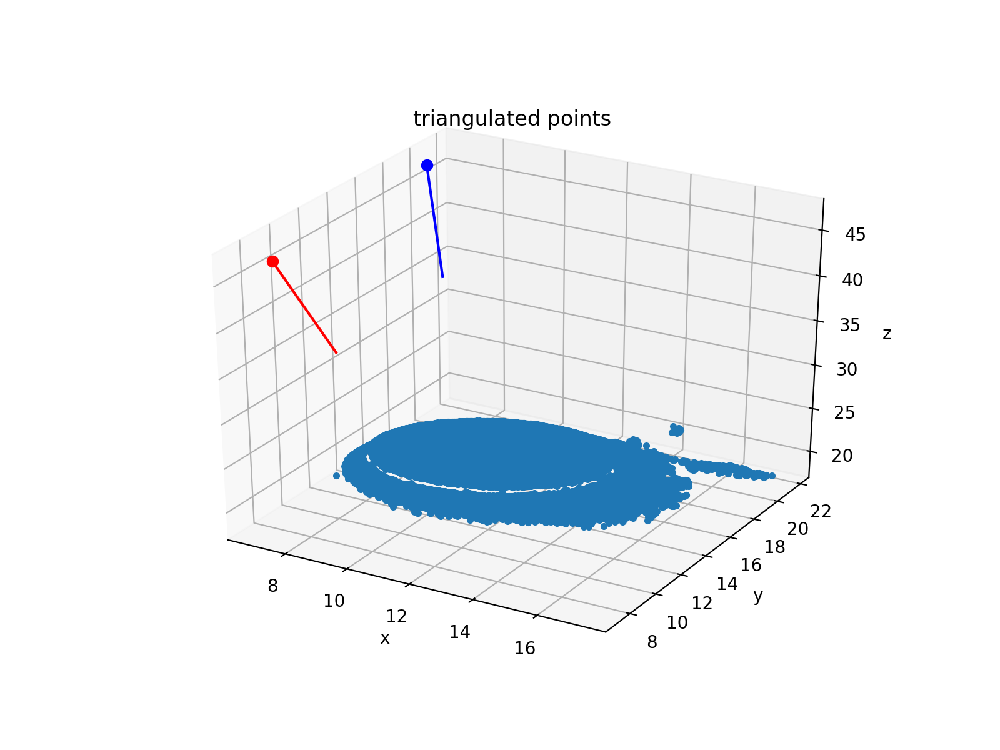

<IPython.core.display.Javascript object>


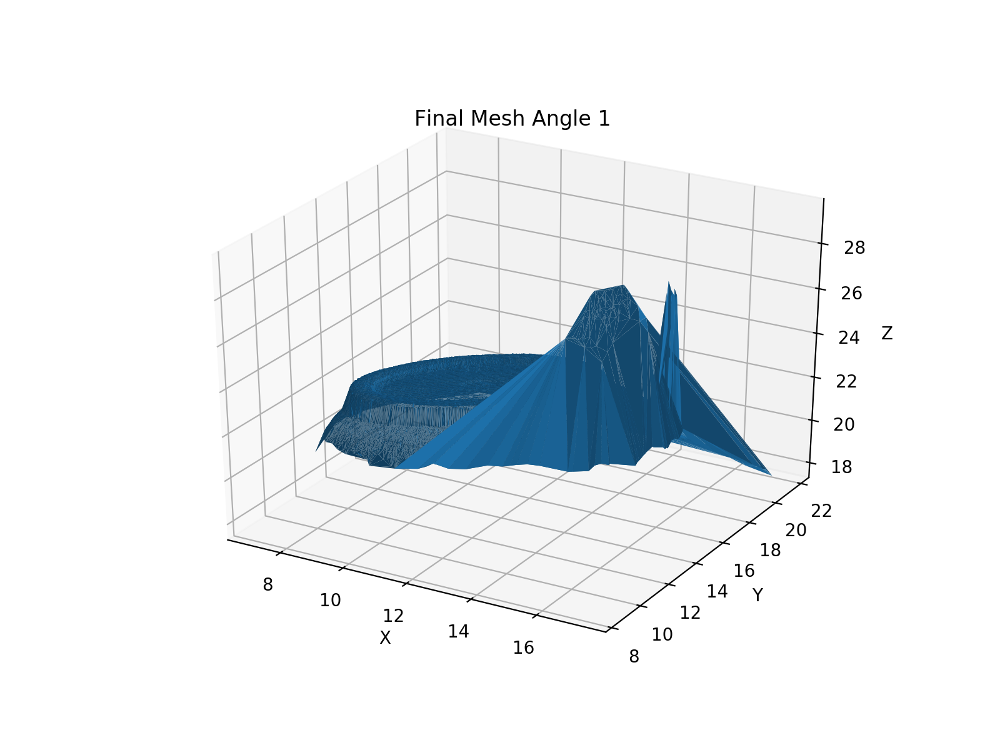

/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


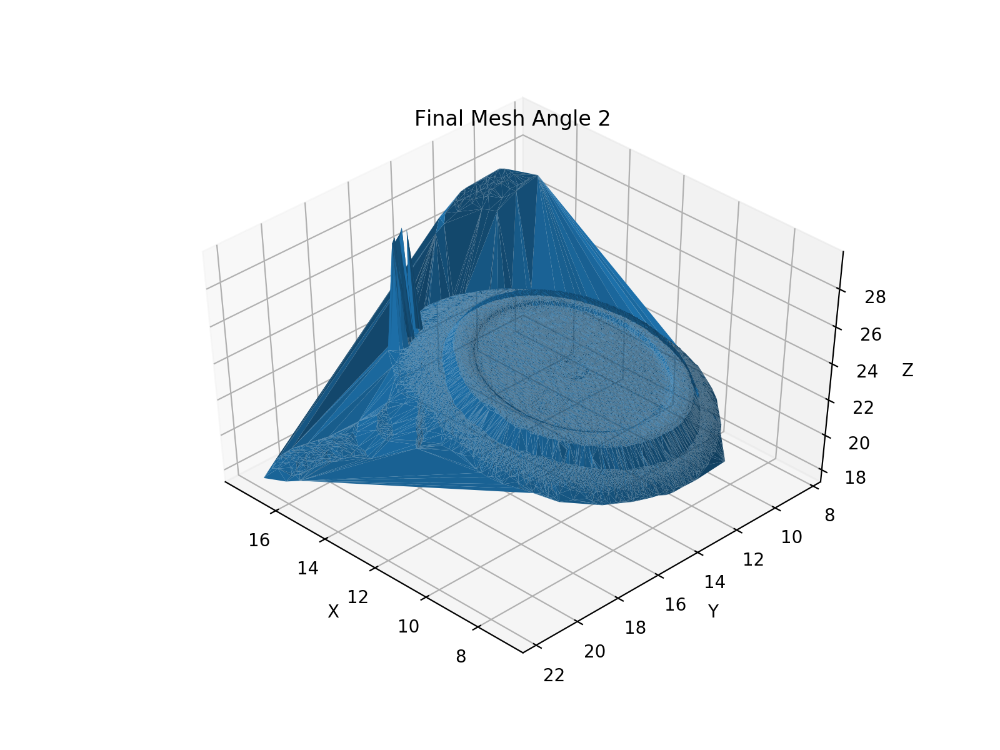

In [36]:
%matplotlib notebook

imgfolder=['grab_0_u/','grab_1_u/','grab_2_u/','grab_3_u/','grab_4_u/','grab_5_u/','grab_6_u/']
vases=['vase0', 'vase1', 'vase2', 'vase3', 'vase4', 'vase5', 'vase6']
path ='/Users/gbanuru/Documents/UCI Class Folders/Spring19/CS 117/Project/'
thresh = .02
cthresh = 0.6

boxlim0 = np.array([-5,19.5,0,25,15,40])
boxlim1 = np.array([-5,19.5,5,20,18,30])
boxlim2 = np.array([-5,19.5,2,22,18,26])
boxlim3 = np.array([-5,19.5,6,18,15,26])
boxlim4 = np.array([-5,19.5,4,22,15,26])
boxlim5 = np.array([5,20,4,24,11,26])
boxlim6 = np.array([5,18,7,22,17,30])

boxlimits = [boxlim0,boxlim1,boxlim2,boxlim3,boxlim4,boxlim5,boxlim6]

for x in range(len(imgfolder)):
    tri,pts3bb = make_mesh(path+imgfolder[x],thresh,cthresh,boxlimits[x],vases[x],camL,camR)

    #1a: a plot of the triangulated points generated by your reconstruct code
    fig = plt.figure(figsize=(8,6))
    ax = fig.add_subplot(1,1,1,projection='3d')
    ax.plot(pts3bb.T[0,:],pts3bb.T[1,:],pts3bb.T[2,:],'.')
    ax.plot(camR.t[0],camR.t[1],camR.t[2],'ro')
    ax.plot(camL.t[0],camL.t[1],camL.t[2],'bo')
    ax.plot(lookL[0,:],lookL[1,:],lookL[2,:],'b')
    ax.plot(lookR[0,:],lookR[1,:],lookR[2,:],'r')
    visutils.label_axes(ax)
    plt.title('triangulated points')
    plt.show()

    #1b visualizations the final mesh produced by your code from two different viewpoints
    fig = plt.figure(figsize=(8,6))
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(pts3bb.T[0,:],pts3bb.T[1,:],pts3bb.T[2,:], triangles=tri.simplices)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    plt.title('Final Mesh Angle 1')
    plt.show()

    fig = plt.figure(figsize=(8,6))
    ax = plt.axes(projection='3d')
    ax.plot_trisurf(pts3bb.T[0,:],pts3bb.T[1,:],pts3bb.T[2,:], triangles=tri.simplices)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.view_init(45, 135)
    plt.title('Final Mesh Angle 2')
    plt.show()
